<h2 style="color:#27a9ff">Machine Learning model to predict whether the salary of a person is > $50K or <= $50K </h2>

<p style="font-size:120%;color:#fc8cff">Importing the necessary libraries</p>

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

<p style="font-size:120%;color:#ff5500">Importing the dataset</p

In [3]:
df = pd.read_csv('Census Income.csv')
df

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


<h2>EXPLORATORY DATA ANALYSIS</h2>

In [4]:
df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [5]:
df.tail()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
32559,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


In [6]:
df.describe()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


<p style="font-size:140%;color:#05b811">We will check the null values in the dataset</p>

In [8]:
df.isnull().sum()

Age               0
Workclass         0
Fnlwgt            0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

In [9]:
df.isnull().sum().sum()

0

<p style="font-size:120%;color:#aa0000">There are null values in the dataset but there are some values which have "?" which can be treated as null values.</p>

<p style="font-size:120%;color:#fc8cff">Checking duplicate values : </p>

In [10]:
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
32555    False
32556    False
32557    False
32558    False
32559    False
Length: 32560, dtype: bool

In [11]:
df.duplicated().sum()

24

In [12]:
#There are 24 duplicate samples we will drop them in the feature engineering step.

<h2>DATA VISUALIZATION</h2>

<Axes: xlabel='Income', ylabel='count'>

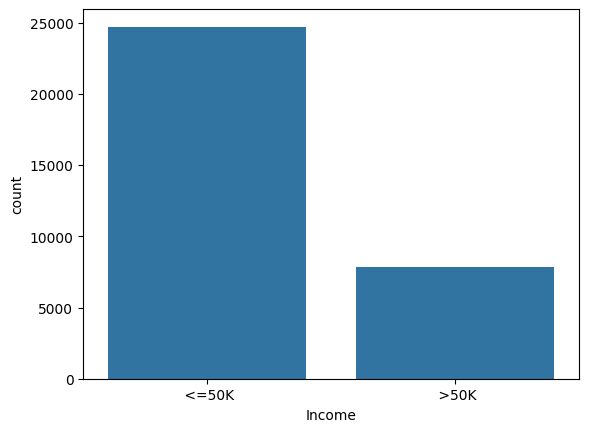

In [13]:
sns.countplot(data=df, x='Income')

In [14]:
num_cols = []
for x in df.columns:
    if df[x].dtype!='object':
        print(x)
        num_cols.append(x)

Age
Fnlwgt
Education_num
Capital_gain
Capital_loss
Hours_per_week


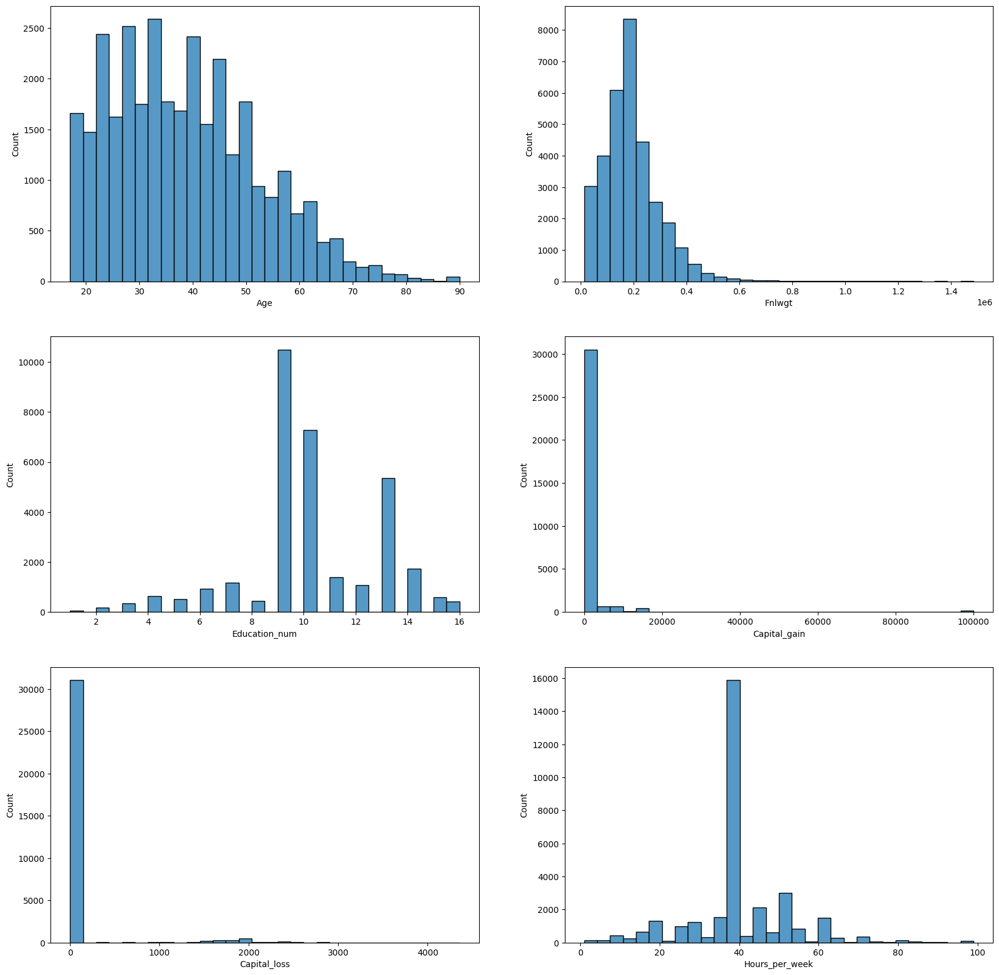

In [15]:
fig, axes = plt.subplots(3,2, figsize=(20,20))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(3,2, plotnumber)
    sns.histplot(data=df, x=x, bins=30)
    plotnumber += 1

In [16]:
num_cols

['Age',
 'Fnlwgt',
 'Education_num',
 'Capital_gain',
 'Capital_loss',
 'Hours_per_week']

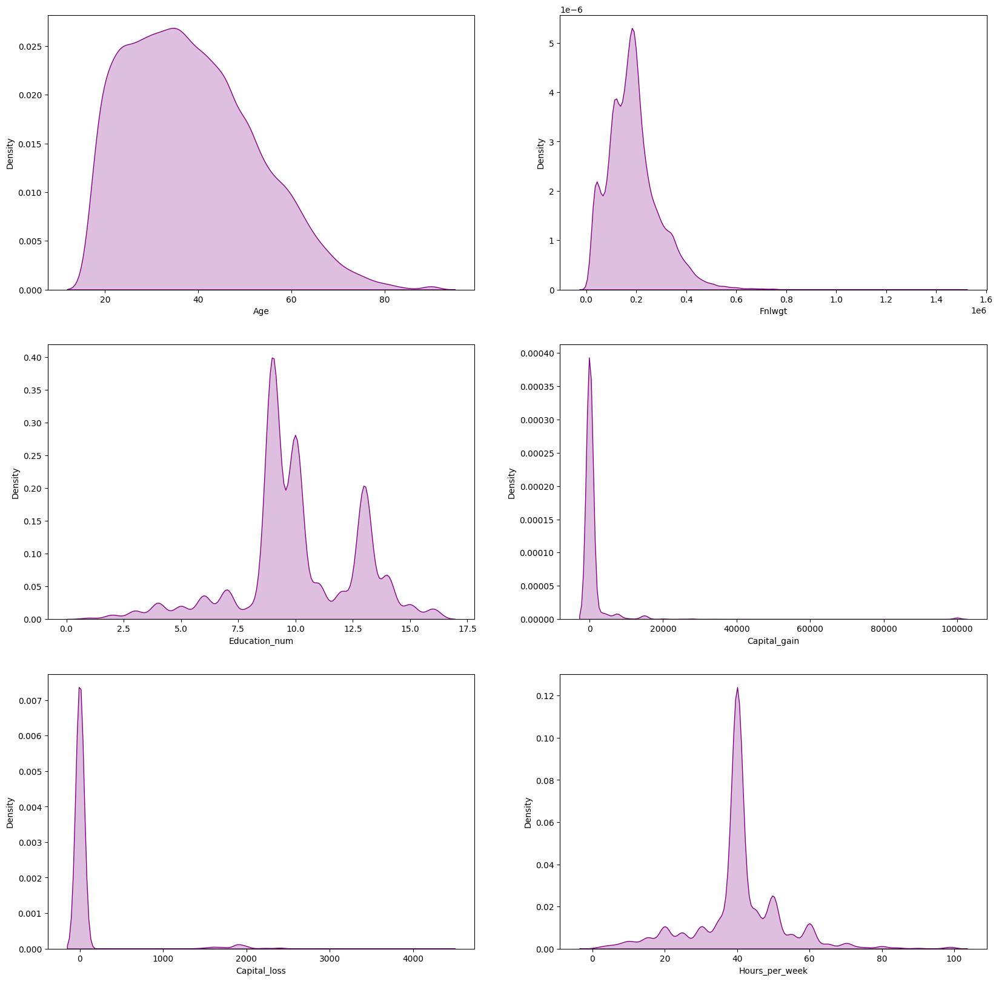

In [17]:
fig, axes = plt.subplots(3,2, figsize=(20,20))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(3,2, plotnumber)
    sns.kdeplot(data=df, x=x, fill=True, color="purple")
    plotnumber += 1

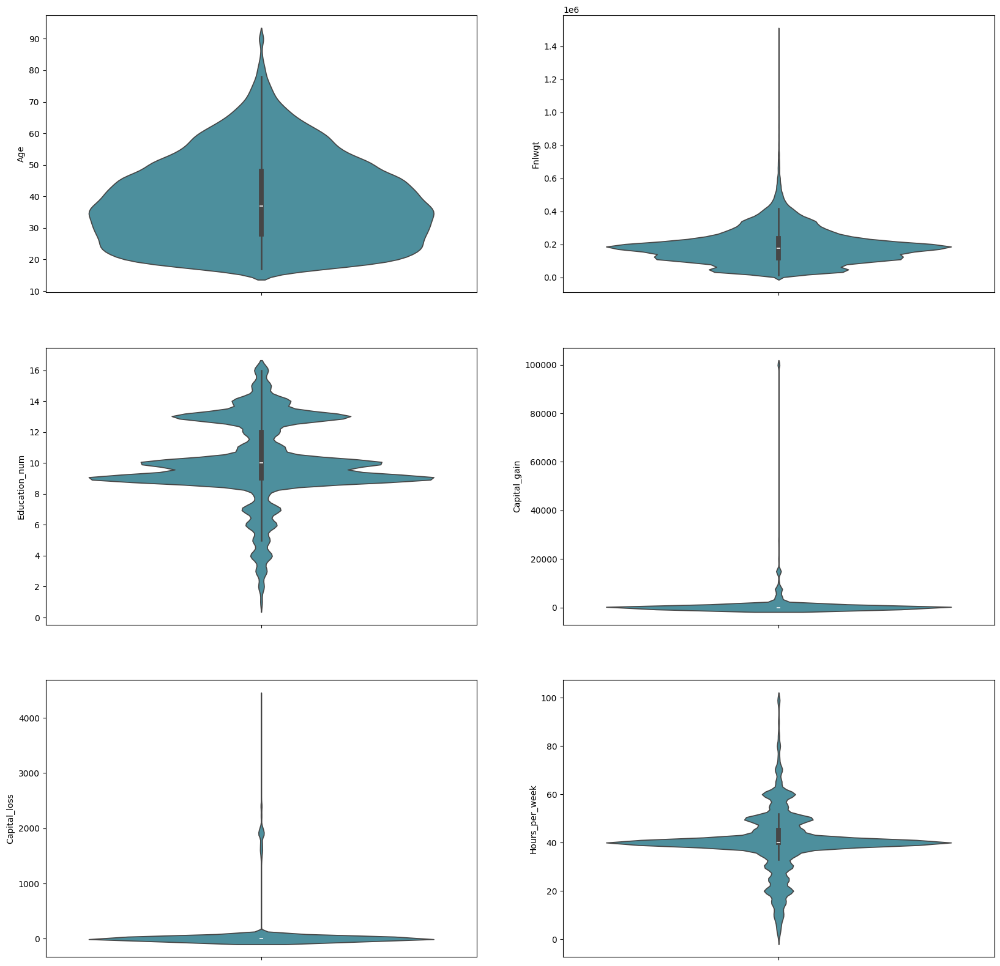

In [18]:
fig, axes = plt.subplots(3,2, figsize=(20,20))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(3,2, plotnumber)
    sns.violinplot(data=df, y=x, color="#4097aa")
    plotnumber += 1

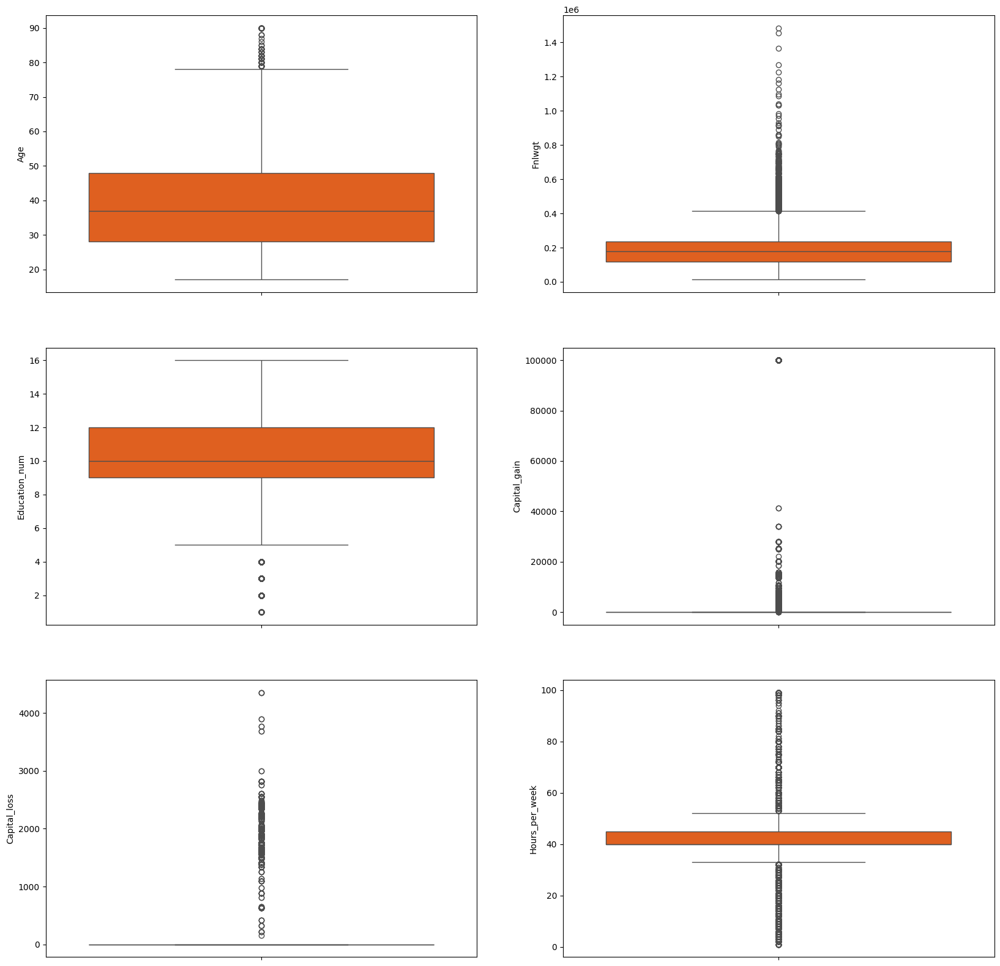

In [19]:
fig, axes = plt.subplots(3,2, figsize=(20,20))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(3,2, plotnumber)
    sns.boxplot(data=df, y=x, color="#ff5500")
    plotnumber += 1

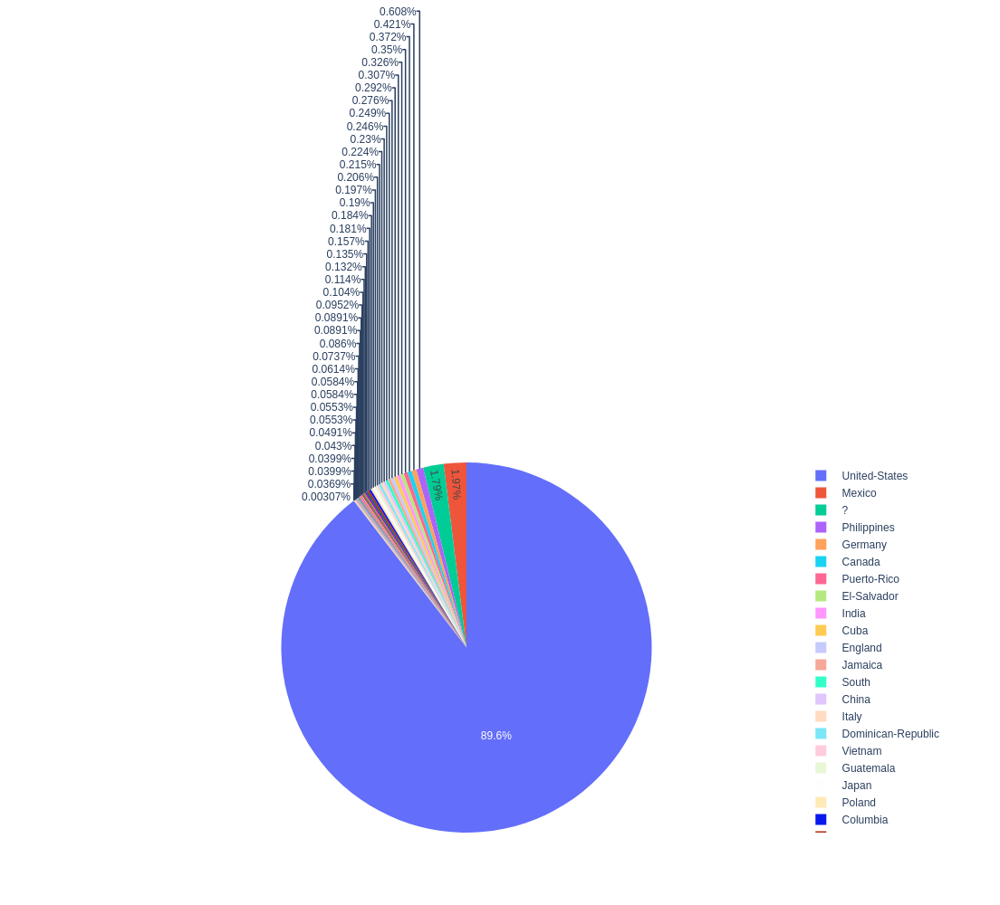

In [20]:
px.pie(data_frame=df, names='Native_country', width=1000, height=1000)

In [21]:
df['Native_country'].value_counts()

Native_country
 United-States                 29169
 Mexico                          643
 ?                               583
 Philippines                     198
 Germany                         137
 Canada                          121
 Puerto-Rico                     114
 El-Salvador                     106
 India                           100
 Cuba                             95
 England                          90
 Jamaica                          81
 South                            80
 China                            75
 Italy                            73
 Dominican-Republic               70
 Vietnam                          67
 Guatemala                        64
 Japan                            62
 Poland                           60
 Columbia                         59
 Taiwan                           51
 Haiti                            44
 Iran                             43
 Portugal                         37
 Nicaragua                        34
 Peru                  

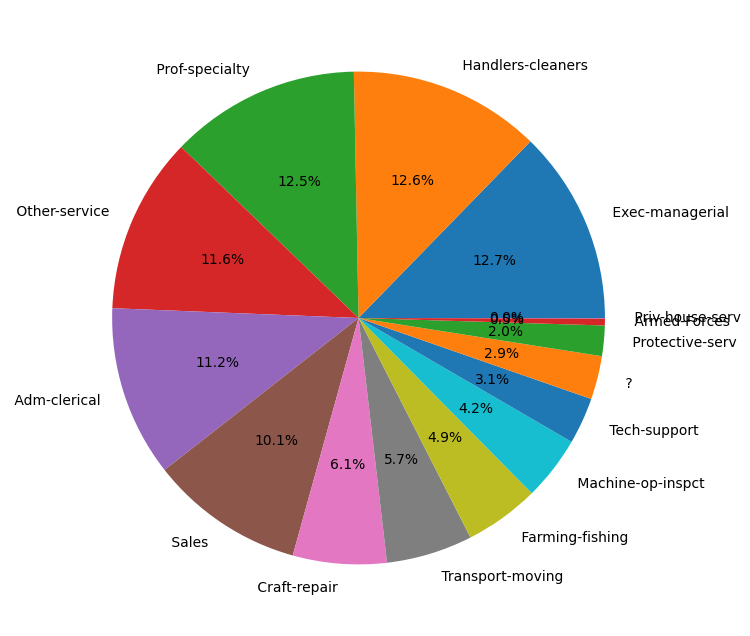

In [22]:
plt.figure(figsize=(12,8))
plt.pie(df['Occupation'].value_counts(), labels=df['Occupation'].unique(), autopct='%1.1f%%')
plt.show()

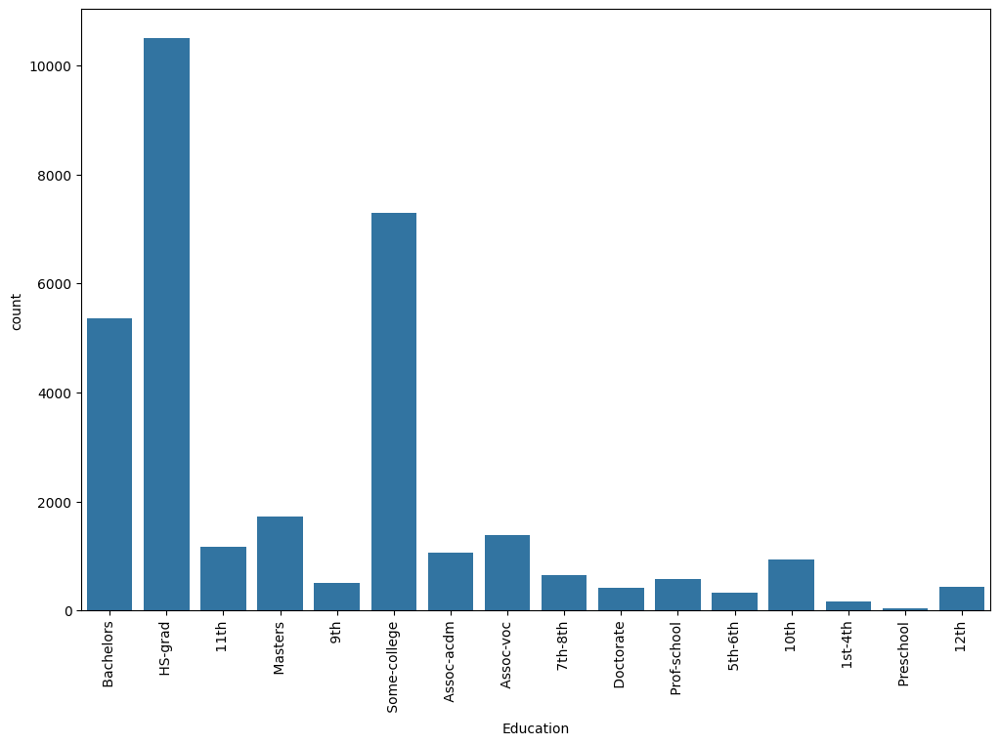

In [23]:
plt.figure(figsize=(12,8))
sns.countplot(data=df, x='Education')
plt.xticks(rotation=90)
plt.show()

In [24]:
df.corr(numeric_only=True)

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week
Age,1.000000,-0.076646,0.036527,0.077674,0.057775,0.068756
Fnlwgt,-0.076646,1.000000,-0.043159,0.000437,-0.010259,-0.018770
Education_num,0.036527,-0.043159,1.000000,0.122627,0.079932,0.148127
Capital_gain,0.077674,0.000437,0.122627,1.000000,-0.031614,0.078409
Capital_loss,0.057775,-0.010259,0.079932,-0.031614,1.000000,0.054256
Hours_per_week,0.068756,-0.018770,0.148127,0.078409,0.054256,1.000000


<Axes: >

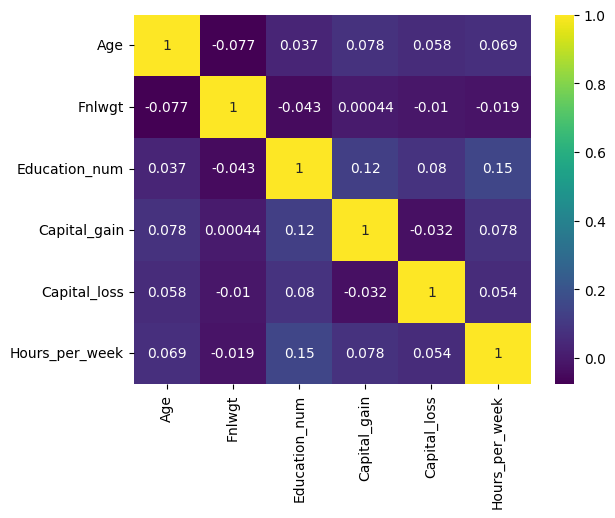

In [25]:
sns.heatmap(data=df.corr(numeric_only=True), annot=True, cmap='viridis')

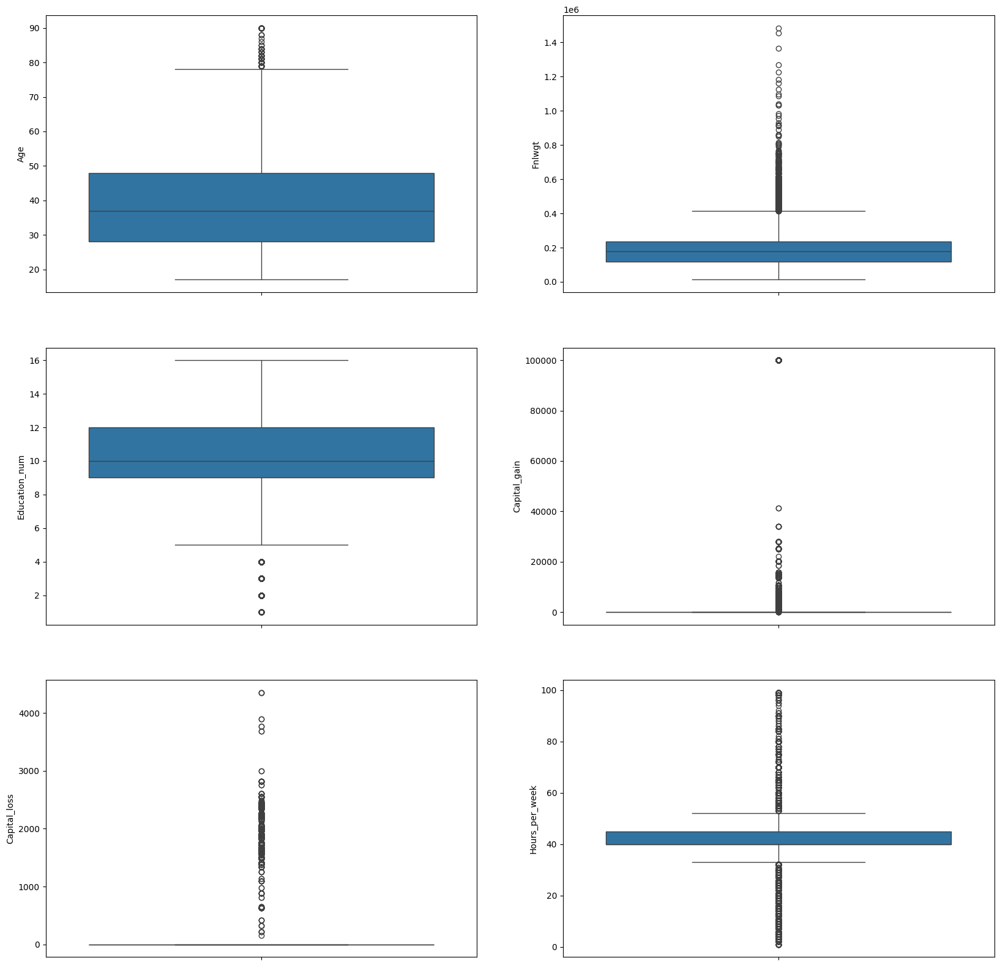

In [26]:
fig, axes = plt.subplots(3,2, figsize=(20,20))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(3,2, plotnumber)
    sns.boxplot(data=df, y=x)
    plotnumber += 1

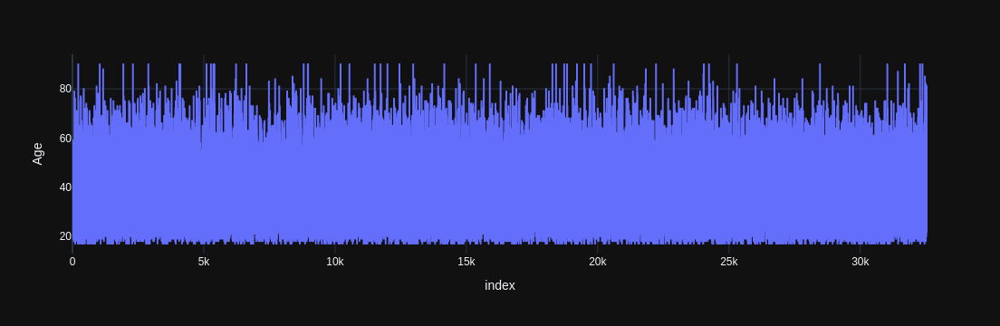

In [27]:
px.line(data_frame=df, y='Age', template='plotly_dark')

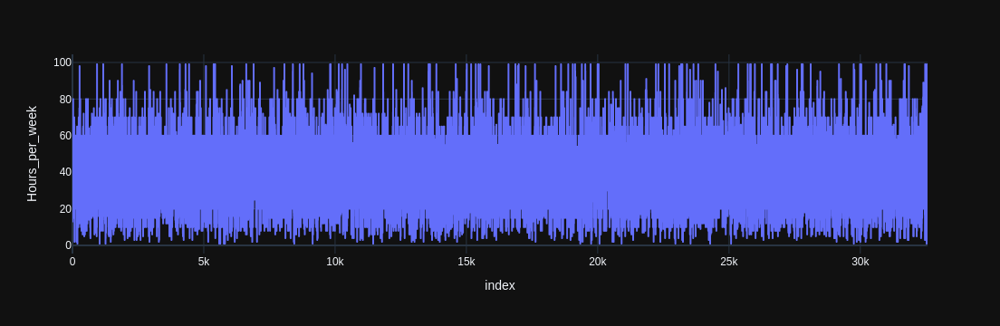

In [28]:
px.line(data_frame=df, y='Hours_per_week', template='plotly_dark')

<Axes: xlabel='Age', ylabel='Hours_per_week'>

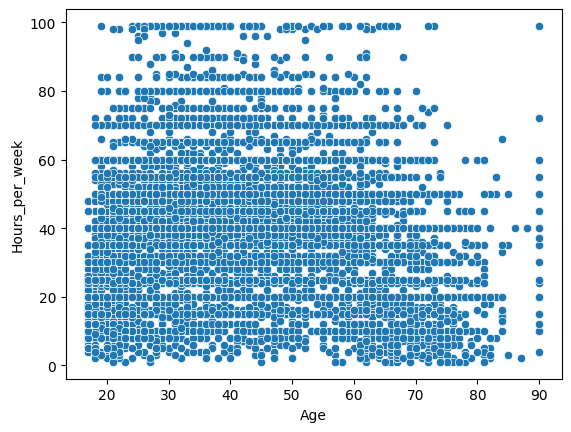

In [29]:
sns.scatterplot(data=df, x='Age', y='Hours_per_week')

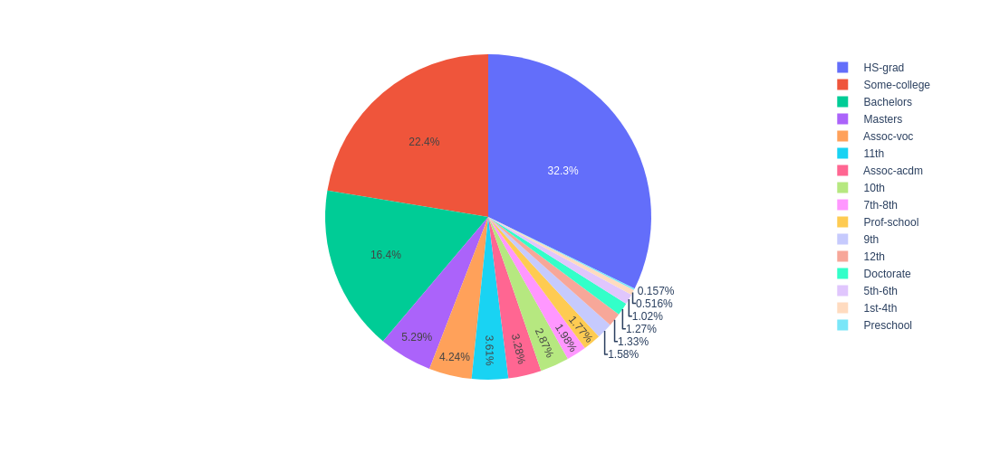

In [30]:
px.pie(data_frame=df, names='Education', width=500, height=500)

<Axes: xlabel='count', ylabel='Education'>

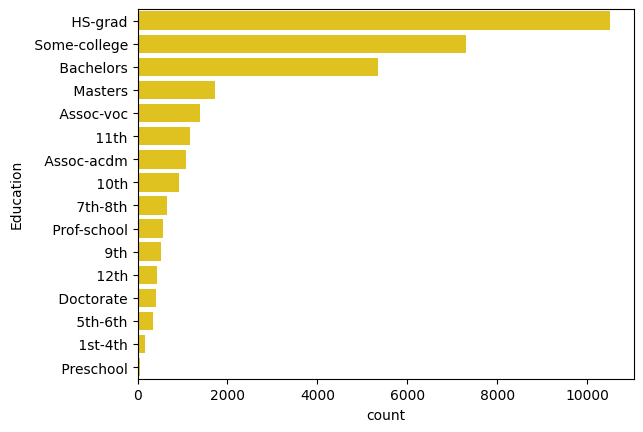

In [31]:
sns.countplot(data=df, y='Education', order=list(df['Education'].value_counts().index), color='gold')

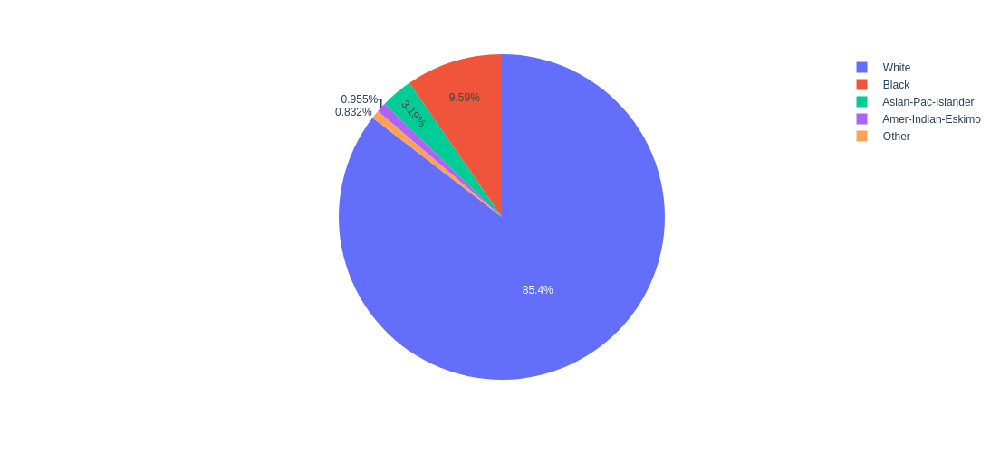

In [32]:
px.pie(data_frame=df, names='Race', width=500, height=500)

<Axes: xlabel='count', ylabel='Race'>

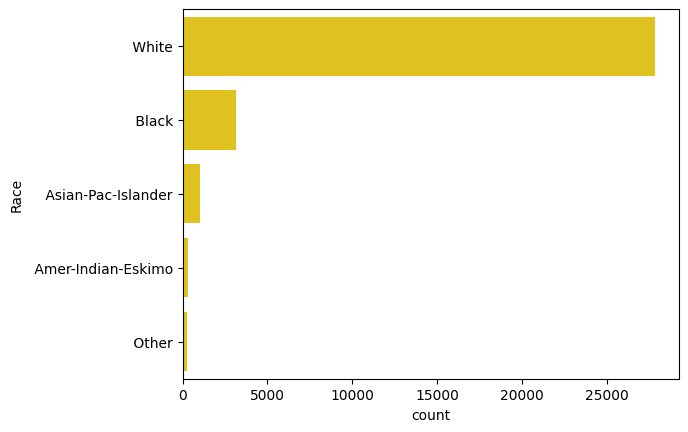

In [33]:
sns.countplot(data=df, y='Race', order=list(df['Race'].value_counts().index), color='gold')

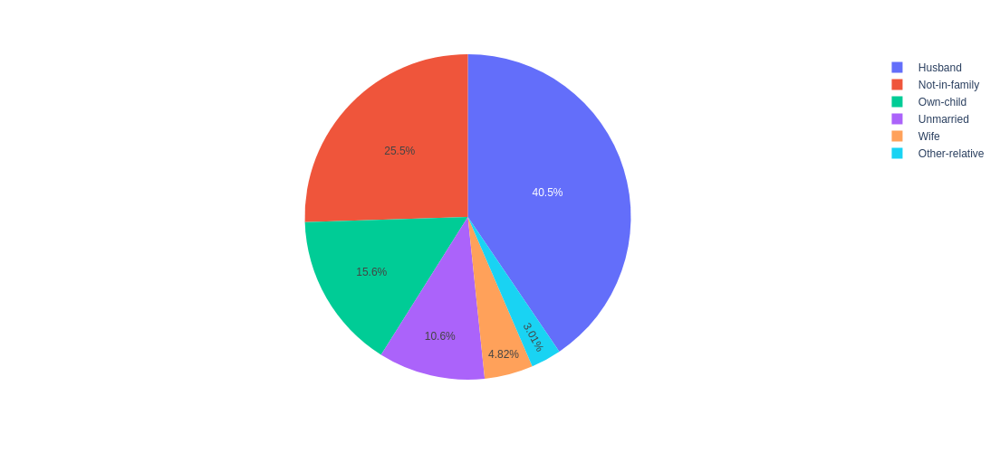

In [34]:
px.pie(data_frame=df, names='Relationship', width=500, height=500)

<Axes: xlabel='count', ylabel='Relationship'>

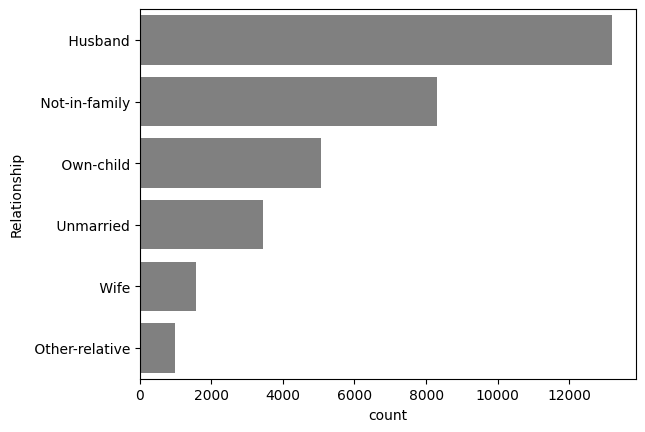

In [35]:
sns.countplot(data=df, y='Relationship', order=list(df['Relationship'].value_counts().index), color='grey')

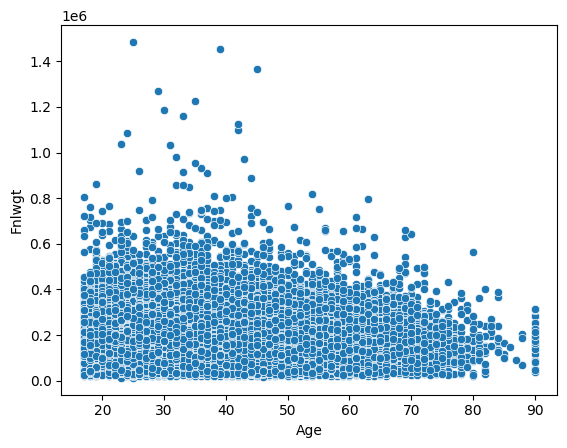

In [36]:
sns.scatterplot(data=df, x='Age', y='Fnlwgt')
plt.show()

In [37]:
df.groupby(by='Workclass')['Fnlwgt'].mean()

Workclass
 ?                   188516.338235
 Federal-gov         185221.243750
 Local-gov           188639.712852
 Never-worked        225989.571429
 Private             192764.114734
 Self-emp-inc        175981.344086
 Self-emp-not-inc    175608.641480
 State-gov           184218.818813
 Without-pay         174267.500000
Name: Fnlwgt, dtype: float64

In [38]:
import warnings
warnings.filterwarnings(action='ignore')

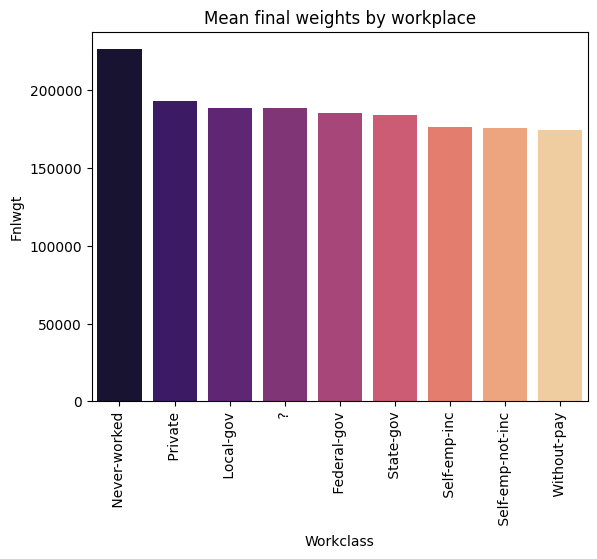

In [40]:
sns.barplot(data=df.groupby(by='Workclass')['Fnlwgt'].mean().sort_values(ascending=False),palette='magma')
plt.xticks(rotation=90)
plt.title('Mean final weights by workplace')
plt.show()

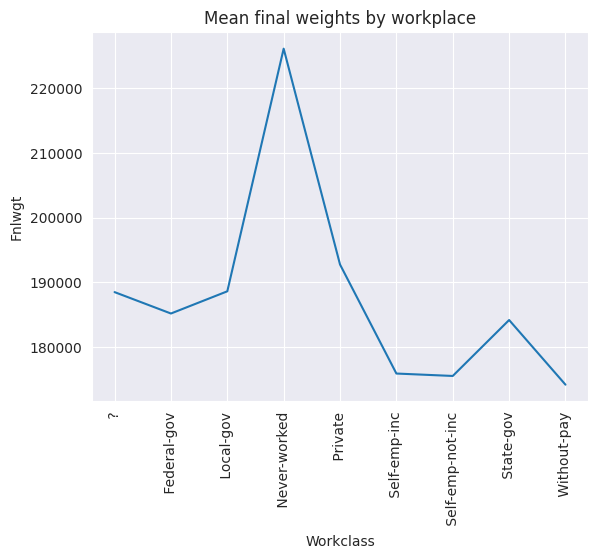

In [41]:
sns.set_style('darkgrid')
sns.lineplot(data=df.groupby(by='Workclass')['Fnlwgt'].mean(),)
plt.xticks(rotation=90)
plt.title('Mean final weights by workplace')
plt.show()

In [42]:
num_cols

['Age',
 'Fnlwgt',
 'Education_num',
 'Capital_gain',
 'Capital_loss',
 'Hours_per_week']

In [43]:
df.groupby(by='Workclass')['Hours_per_week'].mean()

Workclass
 ?                   31.919390
 Federal-gov         41.379167
 Local-gov           40.982800
 Never-worked        28.428571
 Private             40.267096
 Self-emp-inc        48.818100
 Self-emp-not-inc    44.421881
 State-gov           39.030840
 Without-pay         32.714286
Name: Hours_per_week, dtype: float64

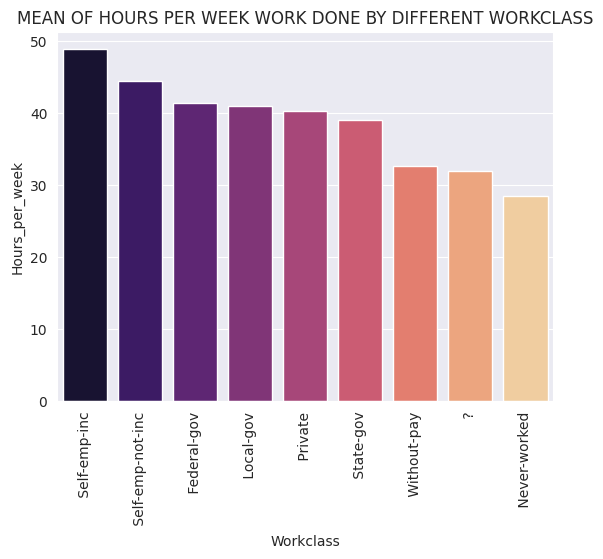

In [44]:
sns.barplot(df.groupby(by='Workclass')['Hours_per_week'].mean().sort_values(ascending=False), palette='magma')
plt.title('MEAN OF HOURS PER WEEK WORK DONE BY DIFFERENT WORKCLASS')
plt.xticks(rotation=90)
plt.show()

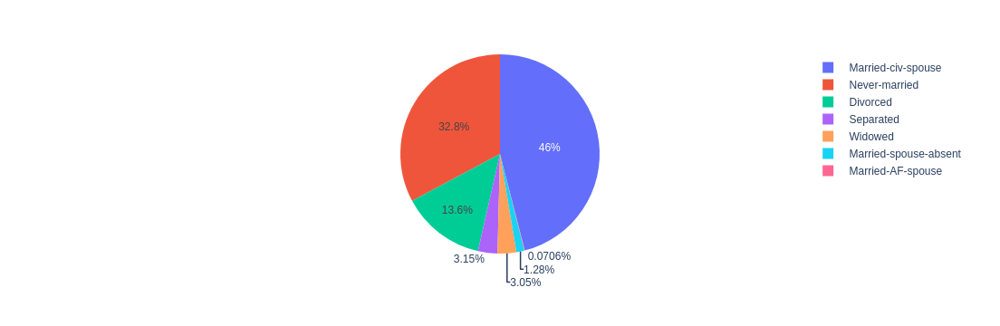

In [45]:
px.pie(data_frame=df, names='Marital_status')

<Axes: xlabel='count', ylabel='Marital_status'>

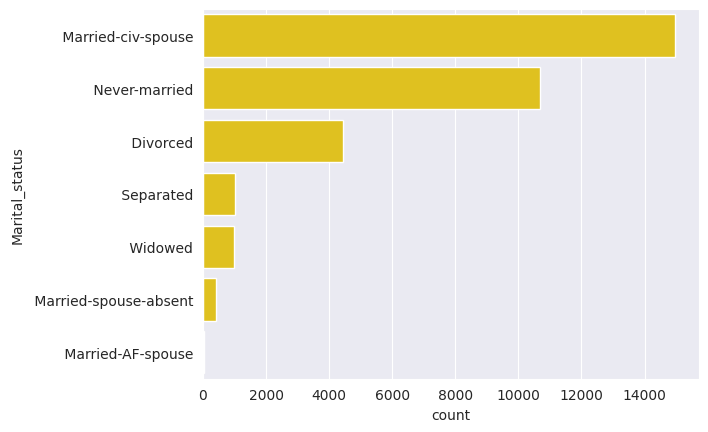

In [46]:
sns.countplot(data=df, y='Marital_status', order=list(df['Marital_status'].value_counts().index), color='gold')

In [47]:
pd.crosstab(index=df['Sex'], columns=df['Income'])

Income,<=50K,>50K
Sex,,
Female,9592,1179
Male,15127,6662


<Axes: xlabel='Sex', ylabel='count'>

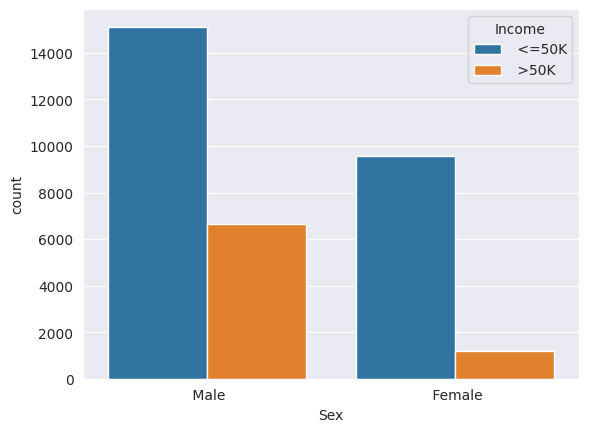

In [48]:
sns.countplot(data=df, x='Sex', hue='Income')

In [49]:
pd.crosstab(index=df['Education'], columns=df['Income'])

Income,<=50K,>50K
Education,,
10th,871,62
11th,1115,60
12th,400,33
1st-4th,162,6
5th-6th,317,16
7th-8th,606,40
9th,487,27
Assoc-acdm,802,265
Assoc-voc,1021,361


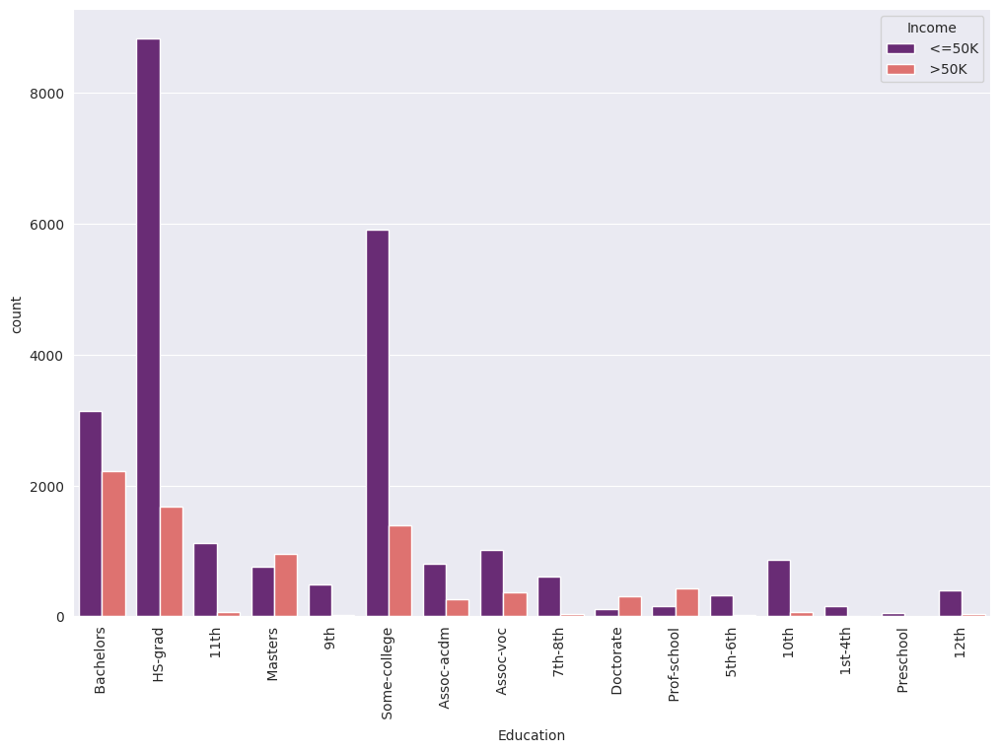

In [50]:
plt.figure(figsize=(12,8))
sns.countplot(data=df, x='Education', hue='Income', palette='magma')
plt.xticks(rotation=90)
plt.show()

In [51]:
pd.crosstab(index=df['Occupation'], columns=df['Income'])

Income,<=50K,>50K
Occupation,,
?,1652,191
Adm-clerical,3262,507
Armed-Forces,8,1
Craft-repair,3170,929
Exec-managerial,2098,1968
Farming-fishing,879,115
Handlers-cleaners,1284,86
Machine-op-inspct,1752,250
Other-service,3158,137


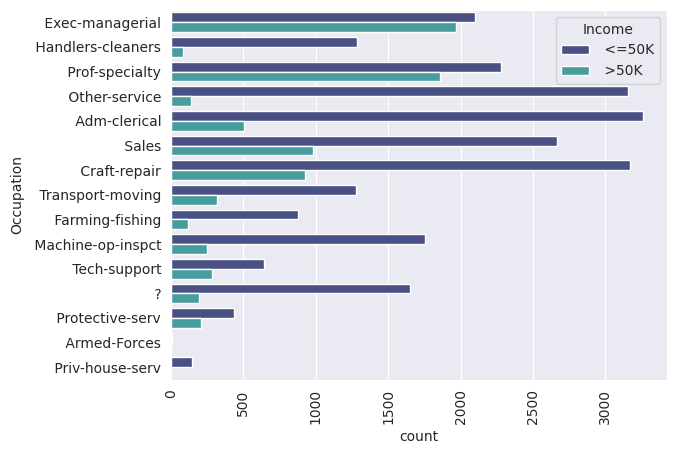

In [52]:
sns.countplot(data=df, y='Occupation', hue='Income', palette='mako')
plt.xticks(rotation=90)
plt.show()

In [53]:
pd.crosstab(index=df['Workclass'], columns=df['Income'])

Income,<=50K,>50K
Workclass,,
?,1645,191
Federal-gov,589,371
Local-gov,1476,617
Never-worked,7,0
Private,17733,4963
Self-emp-inc,494,622
Self-emp-not-inc,1817,724
State-gov,944,353
Without-pay,14,0


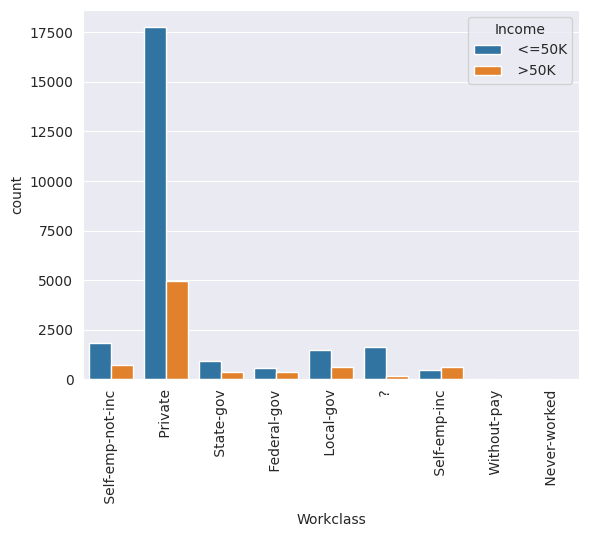

In [54]:
sns.countplot(data=df, x='Workclass', hue='Income', palette='tab10')
plt.xticks(rotation=90)
plt.show()

In [55]:
df.groupby(by='Workclass')['Capital_gain'].mean()

Workclass
 ?                    606.795752
 Federal-gov          833.232292
 Local-gov            880.202580
 Never-worked           0.000000
 Private              889.217792
 Self-emp-inc        4875.693548
 Self-emp-not-inc    1886.061787
 State-gov            700.564379
 Without-pay          487.857143
Name: Capital_gain, dtype: float64

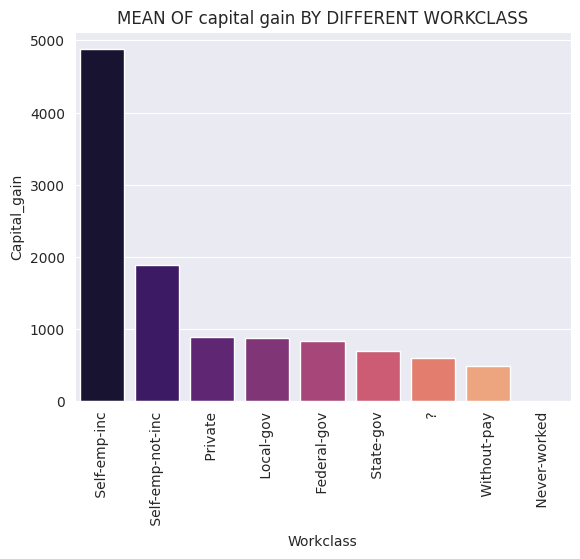

In [56]:
sns.barplot(df.groupby(by='Workclass')['Capital_gain'].mean().sort_values(ascending=False), palette='magma')
plt.title('MEAN OF capital gain BY DIFFERENT WORKCLASS')
plt.xticks(rotation=90)
plt.show()

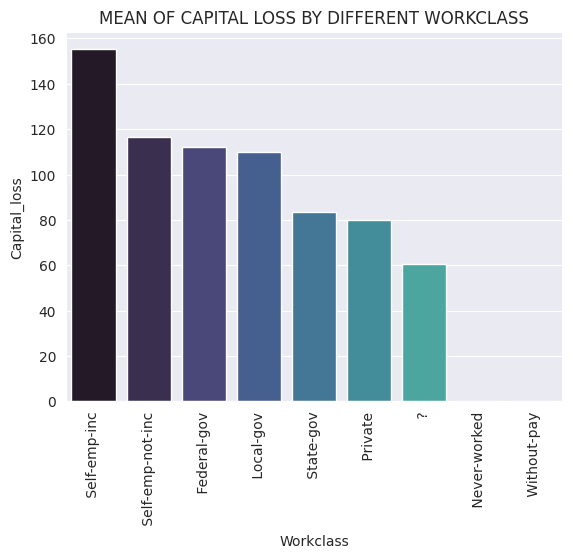

In [57]:
sns.barplot(df.groupby(by='Workclass')['Capital_loss'].mean().sort_values(ascending=False), palette='mako')
plt.title('MEAN OF CAPITAL LOSS BY DIFFERENT WORKCLASS')
plt.xticks(rotation=90)
plt.show()

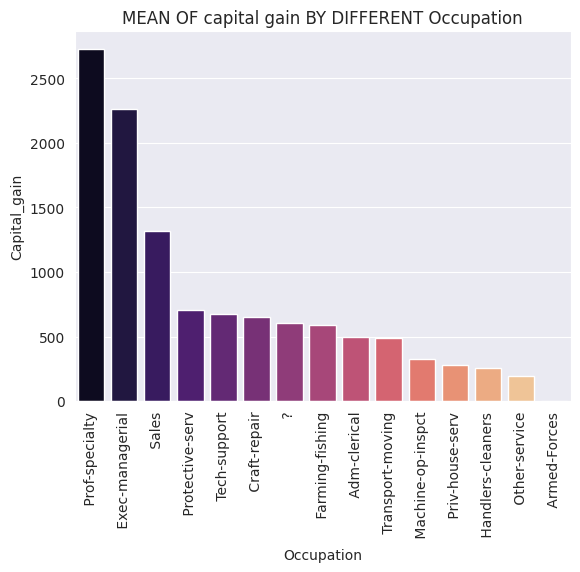

In [58]:
sns.barplot(df.groupby(by='Occupation')['Capital_gain'].mean().sort_values(ascending=False), palette='magma')
plt.title('MEAN OF capital gain BY DIFFERENT Occupation')
plt.xticks(rotation=90)
plt.show()

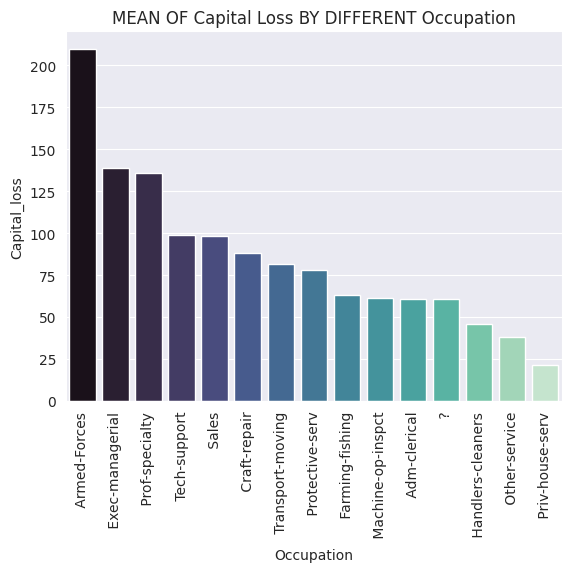

In [59]:
sns.barplot(df.groupby(by='Occupation')['Capital_loss'].mean().sort_values(ascending=False), palette='mako')
plt.title('MEAN OF Capital Loss BY DIFFERENT Occupation')
plt.xticks(rotation=90)
plt.show()

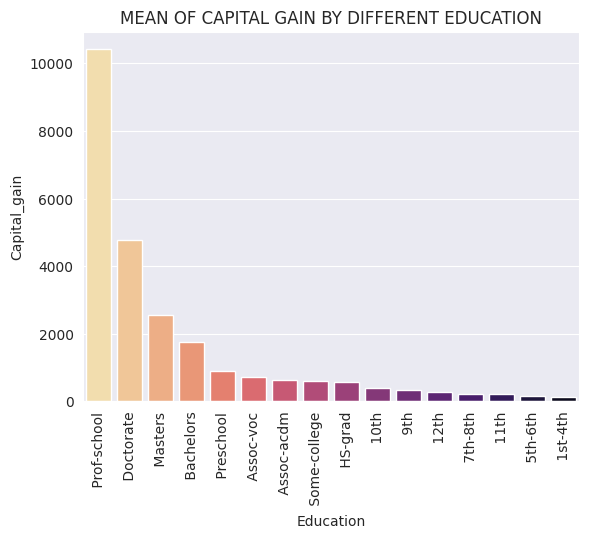

In [60]:
sns.barplot(df.groupby(by='Education')['Capital_gain'].mean().sort_values(ascending=False), palette='magma_r')
plt.title('MEAN OF CAPITAL GAIN BY DIFFERENT EDUCATION')
plt.xticks(rotation=90)
plt.show()

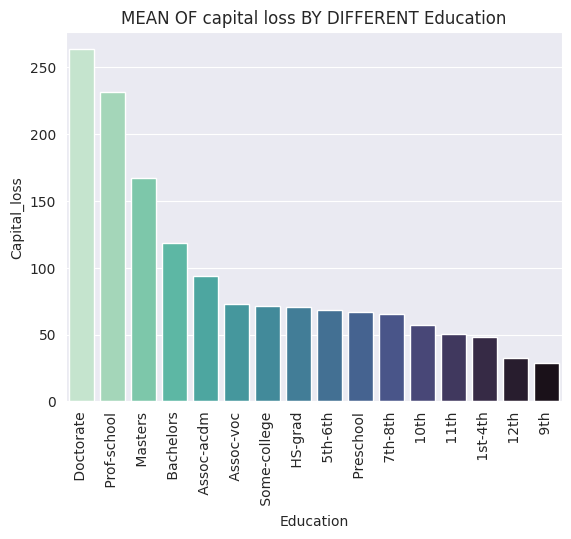

In [61]:
sns.barplot(df.groupby(by='Education')['Capital_loss'].mean().sort_values(ascending=False), palette='mako_r')
plt.title('MEAN OF capital loss BY DIFFERENT Education')
plt.xticks(rotation=90)
plt.show()

<h2>FEATURE ENGINEERING</h2>

<p style="font-size:140%;color:#2c86c2">First, we will replace all "?" values with "NaN" beacuse we will fill null values with some different values.

In [62]:
df['Workclass'].unique()

array([' Self-emp-not-inc', ' Private', ' State-gov', ' Federal-gov',
       ' Local-gov', ' ?', ' Self-emp-inc', ' Without-pay',
       ' Never-worked'], dtype=object)

In [63]:
for x in df.drop(num_cols, axis=1).columns:
    print(x," --- ",df[x].unique())
    print('\n\n')

Workclass  ---  [' Self-emp-not-inc' ' Private' ' State-gov' ' Federal-gov' ' Local-gov'
 ' ?' ' Self-emp-inc' ' Without-pay' ' Never-worked']



Education  ---  [' Bachelors' ' HS-grad' ' 11th' ' Masters' ' 9th' ' Some-college'
 ' Assoc-acdm' ' Assoc-voc' ' 7th-8th' ' Doctorate' ' Prof-school'
 ' 5th-6th' ' 10th' ' 1st-4th' ' Preschool' ' 12th']



Marital_status  ---  [' Married-civ-spouse' ' Divorced' ' Married-spouse-absent'
 ' Never-married' ' Separated' ' Married-AF-spouse' ' Widowed']



Occupation  ---  [' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Adm-clerical' ' Sales' ' Craft-repair'
 ' Transport-moving' ' Farming-fishing' ' Machine-op-inspct'
 ' Tech-support' ' ?' ' Protective-serv' ' Armed-Forces'
 ' Priv-house-serv']



Relationship  ---  [' Husband' ' Not-in-family' ' Wife' ' Own-child' ' Unmarried'
 ' Other-relative']



Race  ---  [' White' ' Black' ' Asian-Pac-Islander' ' Amer-Indian-Eskimo' ' Other']



Sex  ---  [' Male' ' Female']



<p style="font-size:120%;color:#c145ff">We see that Workclass, Occupation and Native Country are the three columns which have "?" or null values present which we need to fill.</p>

In [64]:
df.replace(' ?', np.nan, inplace=True)

df

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [65]:
df.iloc[26]['Occupation']

nan

In [66]:
df.isnull().sum()

Age                  0
Workclass         1836
Fnlwgt               0
Education            0
Education_num        0
Marital_status       0
Occupation        1843
Relationship         0
Race                 0
Sex                  0
Capital_gain         0
Capital_loss         0
Hours_per_week       0
Native_country     583
Income               0
dtype: int64

In [67]:
df.drop_duplicates(inplace=True)
df

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


<p style="font-size:120%;color:#aa557f">Now, you see that we have null values in the dataset.</p>

In [68]:
#We will fill these values with the most popular or most frequent value with the help of Simple Imputer

In [69]:
from sklearn.impute import SimpleImputer

In [70]:
si = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

In [71]:
for x in ['Workclass', 'Occupation', 'Native_country']:
    df[[x]] = si.fit_transform(df[[x]])
df

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [72]:
df.isnull().sum()

Age               0
Workclass         0
Fnlwgt            0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

<p style="font-size:120%;color:#d9b018">Now, we have completely removed null values and we have put most frequent values occuring in that particular column.</p>

In [73]:
#Label Encoding the Income column which is our target variable

In [74]:
from sklearn.preprocessing import LabelEncoder

In [75]:
enc = LabelEncoder()

In [76]:
df['Income'] = enc.fit_transform(df['Income'])
df

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,0
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,1
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,0
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,0


In [77]:
#0 is for income <=50K and 1 is for income >50K"

In [78]:
#Now mapping sex column

In [79]:
df['Sex'] = df['Sex'].map({' Male':1, ' Female':0})
df

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,1,0,0,13,United-States,0
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,1,0,0,40,United-States,0
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,1,0,0,40,United-States,0
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,0,0,0,40,Cuba,0
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,0,0,0,40,United-States,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,0,0,0,38,United-States,0
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,1,0,0,40,United-States,1
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,0,0,0,40,United-States,0
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,1,0,0,20,United-States,0


In [80]:
#Now, let's take a look at this heatmap

In [81]:
df.corr(numeric_only=True)

,Age,Fnlwgt,Education_num,Sex,Capital_gain,Capital_loss,Hours_per_week,Income
Age,1.000000,-0.076448,0.036224,0.088708,0.077676,0.057745,0.068515,0.234039
Fnlwgt,-0.076448,1.000000,-0.043353,0.027113,0.000433,-0.010267,-0.018900,-0.009521
Education_num,0.036224,-0.043353,1.000000,0.012181,0.122661,0.079901,0.148426,0.335299
Sex,0.088708,0.027113,0.012181,1.000000,0.048486,0.045576,0.229190,0.215984
Capital_gain,0.077676,0.000433,0.122661,0.048486,1.000000,-0.031638,0.078408,0.223340
Capital_loss,0.057745,-0.010267,0.079901,0.045576,-0.031638,1.000000,0.054229,0.150498
Hours_per_week,0.068515,-0.018900,0.148426,0.229190,0.078408,0.054229,1.000000,0.229659
Income,0.234039,-0.009521,0.335299,0.215984,0.223340,0.150498,0.229659,1.000000


<Axes: >

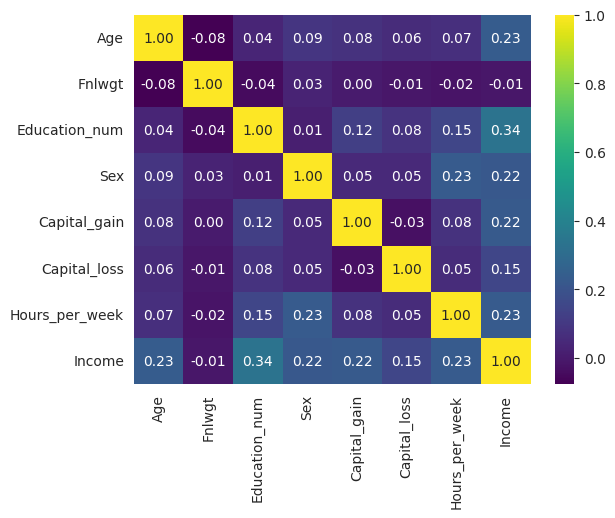

In [82]:
sns.heatmap(data=df.corr(numeric_only=True), fmt='0.2f', annot=True, cmap='viridis')

In [83]:
df = pd.get_dummies(data=df, columns=['Workclass', 'Education', 'Marital_status', 'Occupation', 'Relationship', 'Race', 'Native_country'], dtype=int, drop_first=True)
df

,Age,Fnlwgt,Education_num,Sex,Capital_gain,Capital_loss,Hours_per_week,Income,Workclass_ Local-gov,Workclass_ Never-worked,...,Native_country_ Portugal,Native_country_ Puerto-Rico,Native_country_ Scotland,Native_country_ South,Native_country_ Taiwan,Native_country_ Thailand,Native_country_ Trinadad&Tobago,Native_country_ United-States,Native_country_ Vietnam,Native_country_ Yugoslavia
0,50,83311,13,1,0,0,13,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,38,215646,9,1,0,0,40,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,53,234721,7,1,0,0,40,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,28,338409,13,0,0,0,40,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,37,284582,14,0,0,0,40,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,257302,12,0,0,0,38,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32556,40,154374,9,1,0,0,40,1,0,0,...,0,0,0,0,0,0,0,1,0,0
32557,58,151910,9,0,0,0,40,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32558,22,201490,9,1,0,0,20,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [84]:
#We have transformed all categorical columns into binary numerical columns using One Hot Encoding technique

In [85]:
df.skew()

Age                                 0.557657
Fnlwgt                              1.447695
Education_num                      -0.309454
Sex                                -0.719400
Capital_gain                       11.949245
                                     ...    
Native_country_ Thailand           42.482026
Native_country_ Trinadad&Tobago    41.347059
Native_country_ United-States      -2.950719
Native_country_ Vietnam            21.969490
Native_country_ Yugoslavia         45.063153
Length: 98, dtype: float64

<h2>DATA PREPROCESSING</h2>

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [87]:
X = df.drop('Income', axis=1)
y = df['Income']

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [89]:
X_train.shape

(26028, 97)

In [90]:
X_test.shape

(6508, 97)

In [91]:
from imblearn.over_sampling import SMOTE

smote=SMOTE()

X_train, y_train = smote.fit_resample(X_train, y_train)

In [92]:
#We did apply oversampling technique SMOTE as it was an imabalanced dataset

<h3>SCALING THE DATA</h3>

In [93]:
scaler = StandardScaler()

In [94]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_train

,Age,Fnlwgt,Education_num,Sex,Capital_gain,Capital_loss,Hours_per_week,Workclass_ Local-gov,Workclass_ Never-worked,Workclass_ Private,...,Native_country_ Portugal,Native_country_ Puerto-Rico,Native_country_ Scotland,Native_country_ South,Native_country_ Taiwan,Native_country_ Thailand,Native_country_ Trinadad&Tobago,Native_country_ United-States,Native_country_ Vietnam,Native_country_ Yugoslavia
0,-0.916073,0.240905,-0.605099,-1.498803,-0.198544,-0.258426,-0.181197,4.615424,-0.011242,-1.332094,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
1,-1.725231,-1.388180,-0.193841,-1.498803,-0.198544,-0.258426,-2.353921,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
2,0.621325,-0.768566,1.039932,0.667199,-0.198544,-0.258426,1.122438,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
3,0.297662,-1.168864,-0.193841,0.667199,-0.198544,-0.258426,-0.181197,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
4,1.673230,-0.217890,1.039932,0.667199,-0.198544,-0.258426,-2.788466,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39559,-0.430579,-1.525528,0.628674,0.667199,1.158332,-0.258426,1.383165,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
39560,0.135831,0.342834,1.862448,0.667199,8.832760,-0.258426,1.643892,-0.216665,-0.011242,-1.332094,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
39561,-0.268748,-0.009044,0.217417,0.667199,-0.198544,-0.258426,0.861711,-0.216665,-0.011242,-1.332094,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,-3.013304,-0.036277,-0.018814
39562,0.216747,-0.892989,0.217417,0.667199,-0.198544,-0.258426,0.514075,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,-3.013304,-0.036277,-0.018814


In [95]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
X_test

,Age,Fnlwgt,Education_num,Sex,Capital_gain,Capital_loss,Hours_per_week,Workclass_ Local-gov,Workclass_ Never-worked,Workclass_ Private,...,Native_country_ Portugal,Native_country_ Puerto-Rico,Native_country_ Scotland,Native_country_ South,Native_country_ Taiwan,Native_country_ Thailand,Native_country_ Trinadad&Tobago,Native_country_ United-States,Native_country_ Vietnam,Native_country_ Yugoslavia
0,0.135831,-0.881062,-0.193841,0.667199,0.269101,-0.258426,-0.181197,4.615424,-0.011242,-1.332094,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
1,-0.430579,3.521874,-0.605099,0.667199,-0.198544,-0.258426,-0.181197,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
2,-0.349663,-1.516266,-1.427615,0.667199,-0.198544,-0.258426,0.079530,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
3,-1.644315,-1.024028,-0.605099,0.667199,-0.198544,-0.258426,-0.181197,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
4,0.135831,0.223531,0.217417,0.667199,0.018841,-0.258426,-0.181197,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6503,-0.996989,-0.710626,-0.605099,-1.498803,-0.198544,-0.258426,-0.181197,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
6504,-0.916073,-0.037713,-0.193841,0.667199,-0.198544,-0.258426,1.556983,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
6505,0.783157,-0.965877,1.039932,0.667199,0.460567,-0.258426,-0.181197,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814
6506,0.054915,-0.678132,-0.193841,0.667199,-0.198544,-0.258426,-0.181197,-0.216665,-0.011242,0.750698,...,-0.027547,-0.050338,-0.0159,-0.041187,-0.031813,-0.019475,-0.021335,0.331862,-0.036277,-0.018814


In [96]:
y_train

0        0
1        0
2        0
3        0
4        0
        ..
39559    1
39560    1
39561    1
39562    1
39563    1
Name: Income, Length: 39564, dtype: int64

In [97]:
y_test

280      1
21292    0
8307     0
30297    0
13547    0
        ..
17477    0
12640    0
2494     1
2272     0
27158    1
Name: Income, Length: 6508, dtype: int64

In [98]:
#Our data is ready for training the model.

In [99]:
y_train.value_counts()

Income
0    19782
1    19782
Name: count, dtype: int64

<h2>MACHINE LEARNING MODEL BUILDING</h2>

<h2>LOGISTIC REGRESSION</h2>

<p style="font-size:120%;color:#24703d">Since, this is a binary classification problem, we will start with Logistic Regression model.</p>

In [100]:
from sklearn.linear_model import LogisticRegression

In [101]:
log_model = LogisticRegression()

In [102]:
log_model.fit(X_train, y_train)

LogisticRegression()

In [103]:
log_pred = log_model.predict(X_test)
log_pred

array([1, 0, 0, ..., 1, 0, 1])

In [104]:
#MODEL ACCURACY 

In [105]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, roc_auc_score

In [106]:
print('ACCURACY SCORE : ', accuracy_score(y_test, log_pred))
print("Training accuracy :", log_model.score(X_train, y_train))
print("Test accuracy :", log_model.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, log_pred))
print('\n\n \n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, log_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, log_pred))


ACCURACY SCORE :  0.8458819913952059
Training accuracy : 0.8965220907896068
Test accuracy : 0.8458819913952059
ROC AUC SCORE :  0.7694062719719219


 
-------------------Confusion Matrix--------------

[[4518  397]
 [ 606  987]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           0       0.88      0.92      0.90      4915
           1       0.71      0.62      0.66      1593

    accuracy                           0.85      6508
   macro avg       0.80      0.77      0.78      6508
weighted avg       0.84      0.85      0.84      6508



In [107]:
from sklearn.model_selection import cross_val_score
log_score=cross_val_score(log_model, X, y, cv=5, scoring='accuracy')
print(log_score)
print()
print("cross validation score for Logistic Regression :", np.mean(log_score))

[0.79763368 0.78254188 0.79975411 0.79545105 0.79944675]

cross validation score for Logistic Regression : 0.7949654945848588


<Axes: >

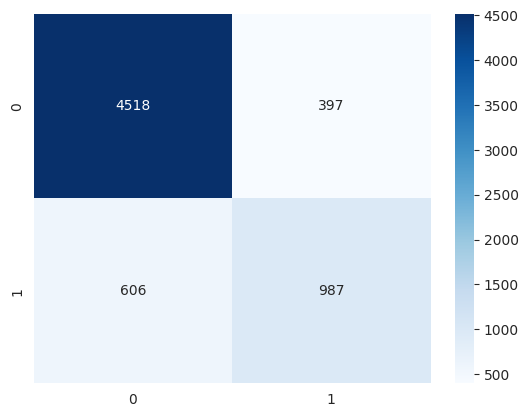

In [108]:
sns.heatmap(confusion_matrix(y_test, log_pred),fmt='0.9g',annot=True,cmap='Blues',)

Text(0.5, 1.0, 'ROC CURVE')

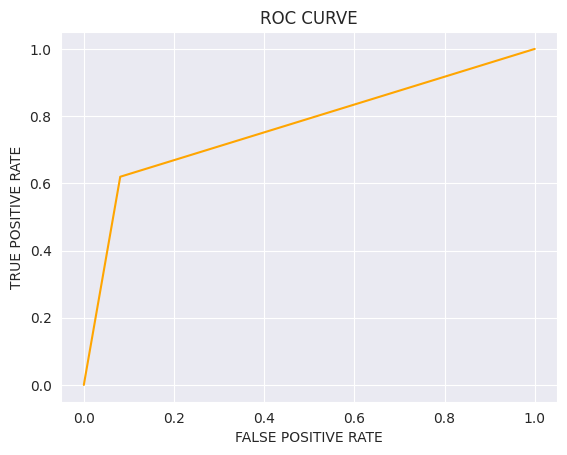

In [109]:
fpr, tpr, _ = roc_curve(y_test, log_pred)
plt.plot(fpr, tpr, color="orange")
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC CURVE')

<p style="font-size:120%;color:#ff1a38">Logistic Regression model is giving good results with 85% accuracy and 0.76 roc auc score which means our model is learning about both the classes equally. There is also no overfitting and underfitting issue as our model is giving training accuracy of 85%.</p>

<h3>DECISION TREE CLASSIFIER</h3>

In [110]:
from sklearn.tree import DecisionTreeClassifier

In [111]:
dtc = DecisionTreeClassifier()

In [112]:
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

In [113]:
dtc_pred = dtc.predict(X_test)
dtc_pred

array([1, 0, 0, ..., 1, 0, 1])

In [114]:
y_test

280      1
21292    0
8307     0
30297    0
13547    0
        ..
17477    0
12640    0
2494     1
2272     0
27158    1
Name: Income, Length: 6508, dtype: int64

In [115]:
print('ACCURACY SCORE : ', accuracy_score(y_test, dtc_pred))
print("Training accuracy :", dtc.score(X_train, y_train))
print("Test accuracy :", dtc.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, dtc_pred))
print('\n\n \n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, dtc_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, dtc_pred))


ACCURACY SCORE :  0.8090043023970498
Training accuracy : 0.9999747244970175
Test accuracy : 0.8090043023970498
ROC AUC SCORE :  0.738839045953207


 
-------------------Confusion Matrix--------------

[[4307  608]
 [ 635  958]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           0       0.87      0.88      0.87      4915
           1       0.61      0.60      0.61      1593

    accuracy                           0.81      6508
   macro avg       0.74      0.74      0.74      6508
weighted avg       0.81      0.81      0.81      6508



In [116]:
dtc_score=cross_val_score(dtc,X,y,cv=5,scoring='accuracy')
print(dtc_score)
print()
print("cross validation score for Decision Tree :",np.mean(dtc_score))

[0.8100799  0.81481481 0.81128016 0.81865683 0.8117412 ]

cross validation score for Decision Tree : 0.8133145818379696


<Axes: >

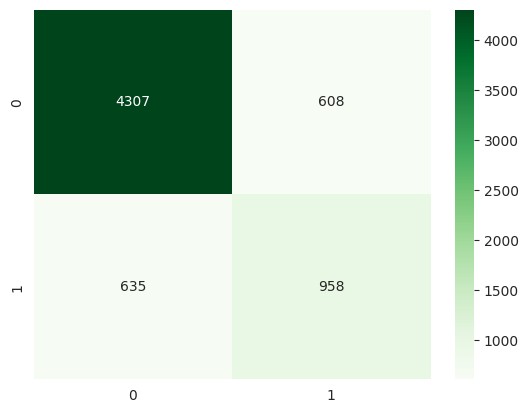

In [117]:
sns.heatmap(confusion_matrix(y_test, dtc_pred),fmt='0.9g',annot=True,cmap='Greens',)

Text(0.5, 1.0, 'ROC CURVE')

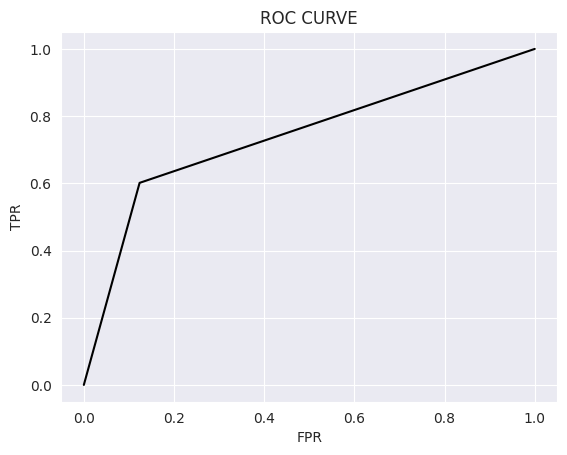

In [118]:
fpr, tpr, _ = roc_curve(y_test, dtc_pred)
plt.plot(fpr, tpr, color="black")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

<p style="font-size:120%;color:#3826ff">Decision Tree is also a good model slightly less accuracte than Logistic Regression.</p>

<h3>RANDOM FOREST CLASSIFIER</h3>

In [119]:
from sklearn.ensemble import RandomForestClassifier

In [120]:
rfc = RandomForestClassifier(n_estimators=150)

In [121]:
rfc.fit(X_train, y_train)

RandomForestClassifier(n_estimators=150)

In [122]:
rfc_pred = rfc.predict(X_test)
rfc_pred

array([1, 0, 0, ..., 1, 1, 1])

In [123]:
print('ACCURACY SCORE : ', accuracy_score(y_test, rfc_pred))
print("Training accuracy :", rfc.score(X_train, y_train))
print("Test accuracy :", rfc.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, rfc_pred))
print('\n\n \n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, rfc_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, rfc_pred))


ACCURACY SCORE :  0.8474185617701291
Training accuracy : 0.9999747244970175
Test accuracy : 0.8474185617701291
ROC AUC SCORE :  0.7706357097653199


 
-------------------Confusion Matrix--------------

[[4527  388]
 [ 605  988]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           0       0.88      0.92      0.90      4915
           1       0.72      0.62      0.67      1593

    accuracy                           0.85      6508
   macro avg       0.80      0.77      0.78      6508
weighted avg       0.84      0.85      0.84      6508



In [124]:
rfc_score=cross_val_score(rfc, X, y, cv=5, scoring='accuracy')
print(rfc_score)
print()
print("cross validation score for Random Forest :", np.mean(rfc_score))

[0.85417947 0.84877824 0.85154449 0.85984325 0.85338866]

cross validation score for Random Forest : 0.8535468209782874


<Axes: >

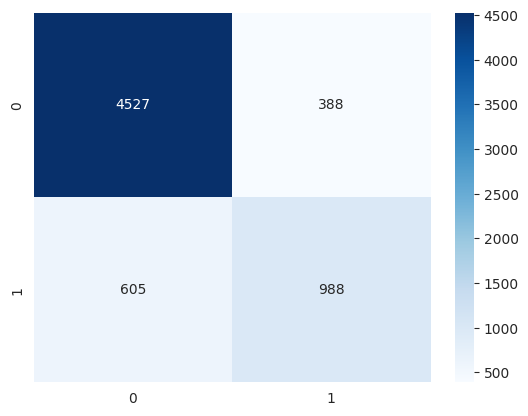

In [125]:
sns.heatmap(confusion_matrix(y_test, rfc_pred),fmt='0.9g', annot=True,cmap='Blues')

Text(0.5, 1.0, 'ROC CURVE')

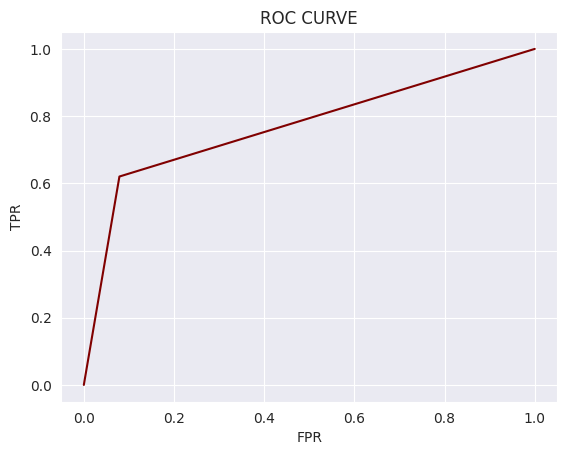

In [126]:
fpr, tpr, _ = roc_curve(y_test, rfc_pred)
plt.plot(fpr, tpr, color="maroon")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

<p style="font-size:120%;color:#ff5500">Random Forest is giving 85% accuracy along with a marginal increas in roc auc score of 0.77.</p>

<h3>SUPPORT VECTOR MACHINE CLASSIFIER</h3>

In [127]:
from sklearn.svm import SVC

In [128]:
svc = SVC()

In [129]:
svc.fit(X_train, y_train)

SVC()

In [130]:
svc_pred = svc.predict(X_test)
svc_pred

array([0, 0, 0, ..., 1, 0, 1])

In [131]:
print('ACCURACY SCORE : ', accuracy_score(y_test, svc_pred))
print("Training accuracy: ",svc.score(X_train,y_train))
print("Test accuracy : ",svc.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, svc_pred))
print('\n\n \n---------Confusion Matrix--------------')
print(confusion_matrix(y_test,svc_pred))
print('\n\n \n---------Classification Report--------------')
print(classification_report(y_test,svc_pred))

ACCURACY SCORE :  0.842040565457898
Training accuracy:  0.903978364169447
Test accuracy :  0.842040565457898
ROC AUC SCORE :  0.7539222654556206


 
---------Confusion Matrix--------------
[[4554  361]
 [ 667  926]]


 
---------Classification Report--------------
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      4915
           1       0.72      0.58      0.64      1593

    accuracy                           0.84      6508
   macro avg       0.80      0.75      0.77      6508
weighted avg       0.83      0.84      0.84      6508



In [132]:
svc_score=cross_val_score(svc, X, y, cv=5, scoring='accuracy')
print(svc_score)
print()
print("cross validation score for SVM :", np.mean(svc_score))

[0.79548248 0.79376057 0.79452897 0.79621946 0.79406793]

cross validation score for SVM : 0.7948118800527709


<Axes: >

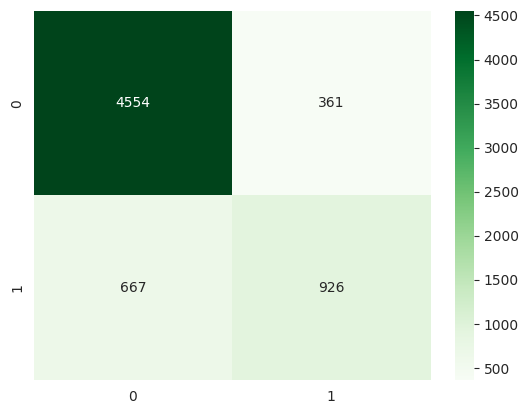

In [133]:
sns.heatmap(confusion_matrix(y_test, svc_pred),fmt='0.9g', annot=True,cmap='Greens')

Text(0.5, 1.0, 'ROC CURVE')

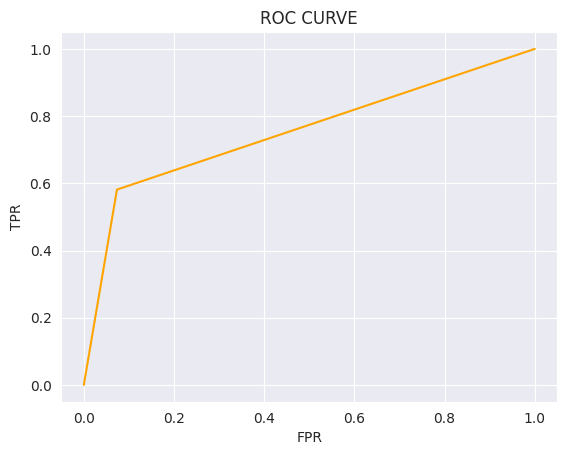

In [134]:
fpr, tpr, _ = roc_curve(y_test, svc_pred)
plt.plot(fpr, tpr, color="orange")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

<h3>KNN MODEL</h3>

In [135]:
from sklearn.neighbors import KNeighborsClassifier

In [136]:
knn = KNeighborsClassifier()

In [137]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [138]:
knn_pred = knn.predict(X_test)
knn_pred

array([0, 0, 0, ..., 0, 1, 0])

In [139]:
print('ACCURACY SCORE : ', accuracy_score(y_test, knn_pred))
print("Training accuracy: ",knn.score(X_train,y_train))
print("Test accuracy : ",knn.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, knn_pred))
print('\n\n \n---------Confusion Matrix--------------')
print(confusion_matrix(y_test,knn_pred))
print('\n\n \n---------Classification Report--------------')
print(classification_report(y_test,knn_pred))

ACCURACY SCORE :  0.8186846957590658
Training accuracy:  0.9115862905671823
Test accuracy :  0.8186846957590658
ROC AUC SCORE :  0.7373986777093835


 
---------Confusion Matrix--------------
[[4407  508]
 [ 672  921]]


 
---------Classification Report--------------
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      4915
           1       0.64      0.58      0.61      1593

    accuracy                           0.82      6508
   macro avg       0.76      0.74      0.75      6508
weighted avg       0.81      0.82      0.82      6508



In [140]:
knn_score=cross_val_score(knn,X,y,cv=5,scoring='accuracy')
print(knn_score)
print()
print("cross validation score for KNN :",np.mean(knn_score))

[0.77627535 0.77685569 0.78069771 0.77393576 0.77455048]

cross validation score for KNN : 0.7764630006038601


<Axes: >

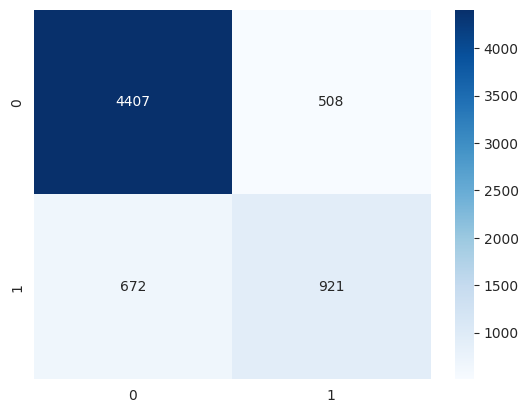

In [141]:
sns.heatmap(confusion_matrix(y_test, knn_pred),fmt='0.9g',annot=True,cmap='Blues')

Text(0.5, 1.0, 'ROC CURVE')

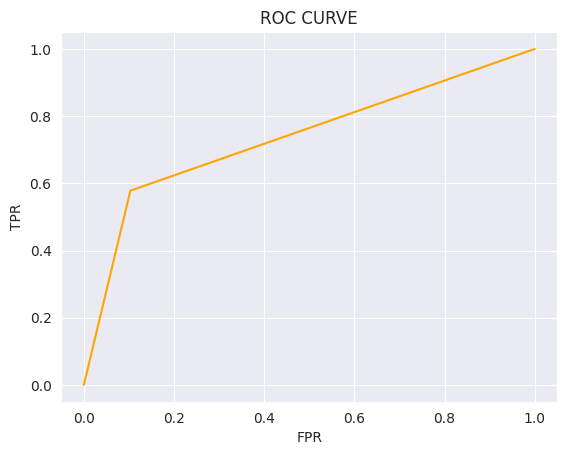

In [142]:
fpr, tpr, _ = roc_curve(y_test, knn_pred)
plt.plot(fpr, tpr, color="orange")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

<h3>ADABOOST CLASSIFIER</h3>

In [143]:
from sklearn.ensemble import AdaBoostClassifier

In [144]:
adaboost = AdaBoostClassifier()

In [145]:
adaboost.fit(X_train, y_train)

AdaBoostClassifier()

In [146]:
adaboost_pred = adaboost.predict(X_test)
adaboost_pred

array([1, 0, 1, ..., 1, 0, 1])

In [147]:
print('ACCURACY SCORE : ', accuracy_score(y_test, adaboost_pred))
print("Training accuracy: ",adaboost.score(X_train,y_train))
print("Test accuracy : ",adaboost.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, adaboost_pred))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,adaboost_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,adaboost_pred))

ACCURACY SCORE :  0.8531038721573448
Training accuracy:  0.8961429582448691
Test accuracy :  0.8531038721573448
ROC AUC SCORE :  0.8007055281914326


 
---------Confusion Matrix--------------

[[4440  475]
 [ 481 1112]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.90      0.90      0.90      4915
           1       0.70      0.70      0.70      1593

    accuracy                           0.85      6508
   macro avg       0.80      0.80      0.80      6508
weighted avg       0.85      0.85      0.85      6508



In [148]:
adaboost_score=cross_val_score(adaboost,X,y,cv=5,scoring='accuracy')
print(adaboost_score)
print()
print("cross validation score for ADABOOST :",np.mean(adaboost_score))

[0.85325753 0.85400338 0.86168741 0.86460735 0.86445367]

cross validation score for ADABOOST : 0.8596018669884987


<Axes: >

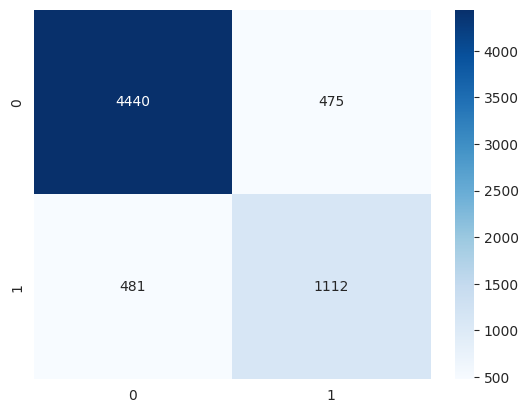

In [150]:
sns.heatmap(confusion_matrix(y_test, adaboost_pred),fmt='0.9g', annot=True,cmap='Blues')

Text(0.5, 1.0, 'ROC CURVE')

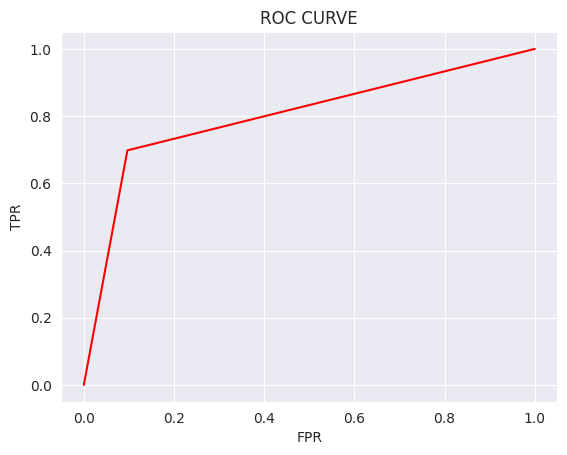

In [152]:
fpr, tpr, _ = roc_curve(y_test, adaboost_pred)
plt.plot(fpr, tpr, color="red")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

<h3>Gradient Boosting</h3>

In [153]:
from sklearn.ensemble import GradientBoostingClassifier

In [154]:
gbc=GradientBoostingClassifier()

In [155]:
gbc.fit(X_train, y_train)

GradientBoostingClassifier()

In [156]:
gbc_pred = gbc.predict(X_test)
gbc_pred

array([1, 0, 0, ..., 1, 0, 1])

In [157]:
print('ACCURACY SCORE : ', accuracy_score(y_test, gbc_pred))
print("Training accuracy: ",gbc.score(X_train,y_train))
print("Test accuracy : ",gbc.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, gbc_pred))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,gbc_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,gbc_pred))

ACCURACY SCORE :  0.8526429010448678
Training accuracy:  0.8962440602567991
Test accuracy :  0.8526429010448678
ROC AUC SCORE :  0.7961574640833914


 
---------Confusion Matrix--------------

[[4457  458]
 [ 501 1092]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.90      0.91      0.90      4915
           1       0.70      0.69      0.69      1593

    accuracy                           0.85      6508
   macro avg       0.80      0.80      0.80      6508
weighted avg       0.85      0.85      0.85      6508



In [158]:
gbc_score=cross_val_score(gbc, X, y, cv=5, scoring='accuracy')
print(gbc_score)
print()
print("cross validation score for GBC :", np.mean(gbc_score))

[0.86109404 0.86276318 0.86706624 0.87075457 0.86768096]

cross validation score for GBC : 0.8658717967100629


Text(0.5, 1.0, 'ROC CURVE')

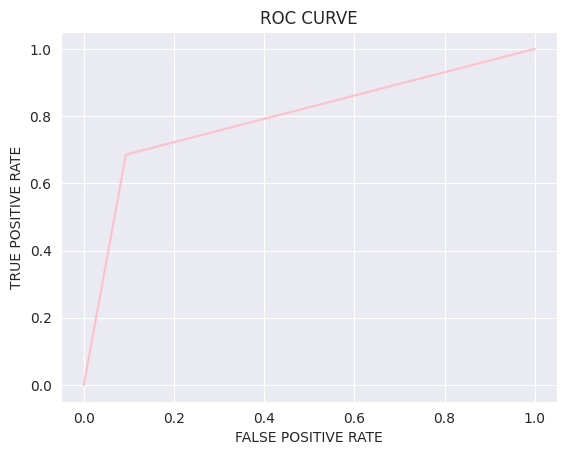

In [159]:
fpr, tpr, _ = roc_curve(y_test, gbc_pred)
plt.plot(fpr, tpr, color="pink")
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC CURVE')

<h3>XGBOOST</h3>

In [160]:
from xgboost import XGBClassifier

In [161]:
xgb = XGBClassifier()

In [162]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [163]:
xgb_pred = xgb.predict(X_test)
xgb_pred

array([1, 0, 0, ..., 1, 0, 1])

In [165]:
print('ACCURACY SCORE : ', accuracy_score(y_test, xgb_pred))
print("Training accuracy: ", xgb.score(X_train, y_train))
print("Test accuracy : ", xgb.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, xgb_pred))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, xgb_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test, xgb_pred))

ACCURACY SCORE :  0.8647818070067609
Training accuracy:  0.9312000808816095
Test accuracy :  0.8647818070067609
ROC AUC SCORE :  0.8005876421449641


 
---------Confusion Matrix--------------

[[4553  362]
 [ 518 1075]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.90      0.93      0.91      4915
           1       0.75      0.67      0.71      1593

    accuracy                           0.86      6508
   macro avg       0.82      0.80      0.81      6508
weighted avg       0.86      0.86      0.86      6508



In [166]:
xgb_score = cross_val_score(xgb,X,y,cv=5,scoring='accuracy')
print(xgb_score)
print()
print("cross validation score for XGB :",np.mean(xgb_score))

[0.86969883 0.86829568 0.86721992 0.87567235 0.87198402]

cross validation score for XGB : 0.8705741601711324


Text(0.5, 1.0, 'ROC CURVE')

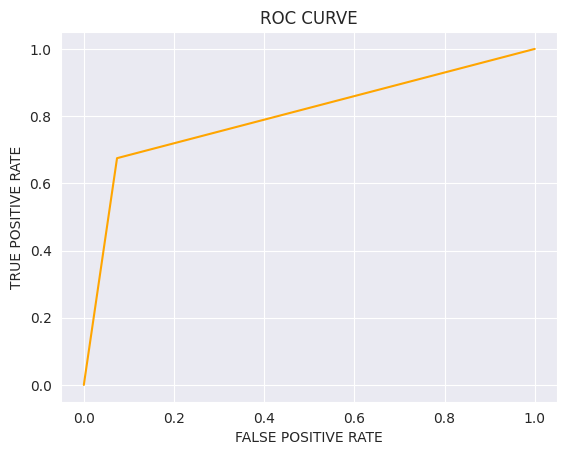

In [167]:
fpr, tpr, _ = roc_curve(y_test, xgb_pred)
plt.plot(fpr, tpr, color="orange")
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC CURVE')

<h3>CATBOOST MODEL</h3>

In [169]:
from catboost import CatBoostClassifier

In [170]:
cat = CatBoostClassifier()

In [171]:
cat.fit(X_train, y_train)

Learning rate set to 0.049543
0:	learn: 0.6520454	total: 62.9ms	remaining: 1m 2s
1:	learn: 0.6122417	total: 77.6ms	remaining: 38.7s
2:	learn: 0.5749706	total: 92ms	remaining: 30.6s
3:	learn: 0.5435901	total: 106ms	remaining: 26.4s
4:	learn: 0.5191038	total: 120ms	remaining: 23.9s
5:	learn: 0.4995082	total: 134ms	remaining: 22.1s
6:	learn: 0.4810758	total: 147ms	remaining: 20.8s
7:	learn: 0.4647739	total: 159ms	remaining: 19.8s
8:	learn: 0.4502216	total: 171ms	remaining: 18.9s
9:	learn: 0.4379733	total: 184ms	remaining: 18.3s
10:	learn: 0.4250417	total: 196ms	remaining: 17.7s
11:	learn: 0.4158468	total: 210ms	remaining: 17.3s
12:	learn: 0.4073491	total: 223ms	remaining: 16.9s
13:	learn: 0.3996990	total: 238ms	remaining: 16.7s
14:	learn: 0.3923714	total: 252ms	remaining: 16.6s
15:	learn: 0.3858654	total: 265ms	remaining: 16.3s
16:	learn: 0.3802281	total: 277ms	remaining: 16s
17:	learn: 0.3742239	total: 287ms	remaining: 15.7s
18:	learn: 0.3636358	total: 298ms	remaining: 15.4s
19:	learn: 0

In [172]:
cat_pred = cat.predict(X_test)
cat_pred

array([1, 0, 0, ..., 1, 0, 1])

In [173]:
print('ACCURACY SCORE : ', accuracy_score(y_test, cat_pred))
print("Training accuracy: ",cat.score(X_train,y_train))
print("Test accuracy : ",cat.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, cat_pred))
print('\n\n \n---------Confusion Matrix--------------')
print(confusion_matrix(y_test,cat_pred))
print('\n\n \n---------Classification Report--------------')
print(classification_report(y_test,cat_pred))

ACCURACY SCORE :  0.864320835894284
Training accuracy:  0.9317308664442422
Test accuracy :  0.864320835894284
ROC AUC SCORE :  0.7966760094232206


 
---------Confusion Matrix--------------
[[4567  348]
 [ 535 1058]]


 
---------Classification Report--------------
              precision    recall  f1-score   support

           0       0.90      0.93      0.91      4915
           1       0.75      0.66      0.71      1593

    accuracy                           0.86      6508
   macro avg       0.82      0.80      0.81      6508
weighted avg       0.86      0.86      0.86      6508



In [174]:
cat_score=cross_val_score(cat,X,y,cv=5,scoring='accuracy')
print(cat_score)
print()
print("cross validation score for CATBOOST :",np.mean(cat_score))

Learning rate set to 0.041431
0:	learn: 0.6492651	total: 7.09ms	remaining: 7.09s
1:	learn: 0.6139384	total: 14.3ms	remaining: 7.15s
2:	learn: 0.5795994	total: 22.4ms	remaining: 7.45s
3:	learn: 0.5526496	total: 29.6ms	remaining: 7.37s
4:	learn: 0.5277386	total: 38.5ms	remaining: 7.67s
5:	learn: 0.5070305	total: 47.5ms	remaining: 7.87s
6:	learn: 0.4856597	total: 55.8ms	remaining: 7.92s
7:	learn: 0.4685265	total: 65.6ms	remaining: 8.13s
8:	learn: 0.4552267	total: 73.6ms	remaining: 8.11s
9:	learn: 0.4404813	total: 83.1ms	remaining: 8.23s
10:	learn: 0.4273918	total: 91.7ms	remaining: 8.25s
11:	learn: 0.4176949	total: 98.5ms	remaining: 8.11s
12:	learn: 0.4078706	total: 105ms	remaining: 7.95s
13:	learn: 0.3991812	total: 110ms	remaining: 7.75s
14:	learn: 0.3919557	total: 115ms	remaining: 7.53s
15:	learn: 0.3860743	total: 118ms	remaining: 7.29s
16:	learn: 0.3802357	total: 122ms	remaining: 7.06s
17:	learn: 0.3737818	total: 126ms	remaining: 6.86s
18:	learn: 0.3687495	total: 131ms	remaining: 6.74s

Text(0.5, 1.0, 'ROC CURVE')

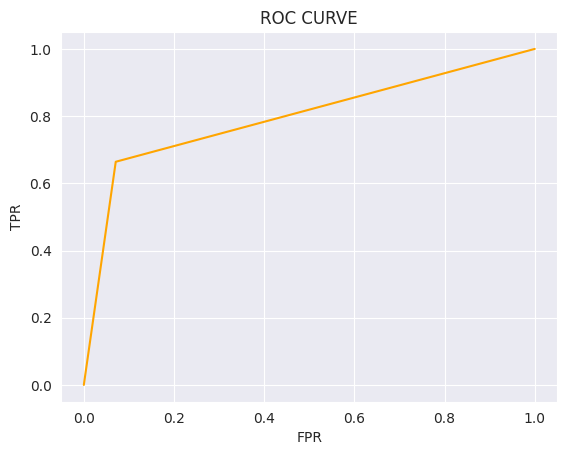

In [175]:
fpr, tpr, _ = roc_curve(y_test, cat_pred)
plt.plot(fpr, tpr, color="orange")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC CURVE')

<p style="font-size:140%;color:#47a0ff">After training and testing multiple machine learning algorithms, we found out that the best performing model was XGBOOST model. It gave an impressive accuracy of 0.86 or 86% accuracy and the roc auc score was also fantastic (0.80).</p>
<p style="font-size:140%;color:#aa55ff">Other models also performed really well and almost all other models apart from XGBOOST gave 84% accuracy.</p>
<p style="font-size:140%;color:#2badb4">No, we will try to hyperparameter tune our XGBOOST model to see if we can improve even further.</p>

<h2>HYPERPARAMETER TUNING</h2>

In [176]:
from sklearn.model_selection import RandomizedSearchCV

In [186]:
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400, 500], 
    'max_depth': [3, 5, 7, 9, 11, 15],           
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.5, 0.7, 0.9],  
    'colsample_bytree': [0.5, 0.7, 0.9] 
}

In [183]:
randomize = RandomizedSearchCV(XGBClassifier(), param_distributions=param_grid, scoring='accuracy',n_jobs=-1,cv=5, verbose=4)

In [184]:
randomize.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.5, 0.7, 0.9],
                                        'learning_rate': [0.01, 0.1, 0.3],
                                        'max_depth': [3, 5, 7, 9, 11, 15],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500],
                                        'subsample': [0.5, 0.7, 0.9]},
                   scoring='accuracy', verbose=4)

In [185]:
randomize.best_score_

0.8927575311236696

In [181]:
randomize.best_params_

{'subsample': 0.9,
 'n_estimators': 200,
 'max_depth': 5,
 'learning_rate': 0.1,
 'colsample_bytree': 0.9}

<p style="font-size:140%;color:#aa0000">We are improving our accuracy by 1% and taking it to 87% accuracy. So, we will use these parameters and again train xgboost model for further analysis.

In [194]:
xgb = XGBClassifier(subsample = 0.9, n_estimators = 200, max_depth = 5, learning_rate = 0.1,
       colsample_bytree= 0.9)
xgb

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [195]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [196]:
xgb_pred = xgb.predict(X_test)
xgb_pred

array([1, 0, 0, ..., 1, 0, 1])

In [197]:
print('ACCURACY SCORE : ', accuracy_score(y_test, xgb_pred))
print("Training accuracy: ", xgb.score(X_train, y_train))
print("Test accuracy : ", xgb.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, xgb_pred))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, xgb_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test, xgb_pred))

ACCURACY SCORE :  0.8672403196066379
Training accuracy:  0.9212668082094834
Test accuracy :  0.8672403196066379
ROC AUC SCORE :  0.805185325677765


 
---------Confusion Matrix--------------

[[4555  360]
 [ 504 1089]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.90      0.93      0.91      4915
           1       0.75      0.68      0.72      1593

    accuracy                           0.87      6508
   macro avg       0.83      0.81      0.81      6508
weighted avg       0.86      0.87      0.87      6508



In [198]:
xgb_score = cross_val_score(xgb,X,y,cv=5,scoring='accuracy')
print(xgb_score)
print()
print("cross validation score for XGB :",np.mean(xgb_score))

[0.86954518 0.87060089 0.8736745  0.8784386  0.87167666]

cross validation score for XGB : 0.872787166277081


Text(0.5, 1.0, 'ROC CURVE')

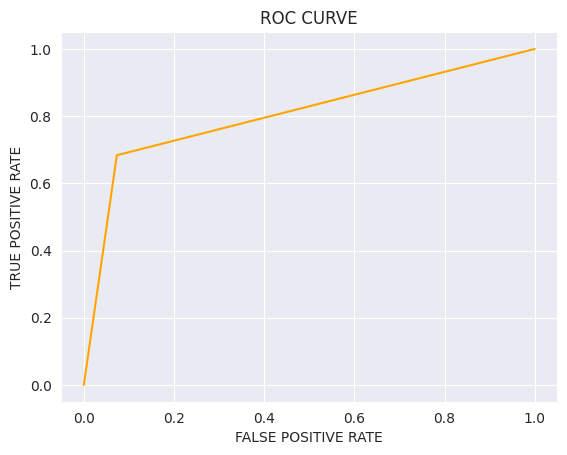

In [199]:
fpr, tpr, _ = roc_curve(y_test, xgb_pred)
plt.plot(fpr, tpr, color="orange")
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC CURVE')

<p style="font-size:120%;color:#4a67aa">We can see that after hypeparamter tuning techniques like RandomizedSearch we can improve the model by a slight margin. So, we will stop here and save the model using joblib library for further reference.</p>

<h2 style="color:purple">SAVING THE MODEL</h2>

In [200]:
import joblib

In [201]:
joblib.dump(xgb, 'Census_Income.pkl')

['Census_Income.pkl']

<h1>DOCUMENTATION ⬇️<h1>

<p style="font-size:140%;color:#797979">We first imported the dataset using pandas dataframe and did some visual representation of the dataset, then cleaned the dataset by filling null values with most frequent values as per the situation. Also, we dropped 24 duplicate samples from the dataset. Then, we did label encoding on Income column and one hot encoding on categorical columns like Occupation, Workclass, Native Country, etc. SMOTE was used for handling imbalanced data. Then, we split the data into training and testing data and then scaled the data using Standard Scaler.</p>
<br>
<p style="font-size:140%;color:#797979">We then trained multiple models and tested them and the results are given below.</p>
<br>
<p style="font-size:140%;color:#797979">The model chosen for this task is a supervised learning model suitable for binary classification tasks. The following models were evaluated:</p>

<p style="font-size:120%;color:#797979">
    <ul style="font-size:140%;color:#797979">
        <li>Logistic Regression</li>
        <li>Decision Tree</li>
        <li>Random Forest</li>
        <li>SVM</li>
        <li>KNN</li>
        <li>ADABOOST</li>
        <li>Gradient Boosting</li>
        <li>XGBOOST</li>
        <li>CatBoosting</li>
    </ul>
</p>
<p style="font-size:140%;color:#797979">The selected model XGBOOST was trained using a training dataset split from the original dataset. Cross-validation was used to tune hyperparameters to optimize performance metrics such as accuracy, precision, recall, and F1-score.
</p>

<p style="font-size:140%;color:#797979">XGBOOST MODEL RESULTS : </p>

<pre style="font-size:140%;color:#797979">⚫ Accuracy : 0.87 or 87%

⚫ Precision :
    ➡️ Macro : 0.83
    ➡️ Weighted : 0.86
    
⚫ Recall : 
     ➡️ Macro : 0.81
     ➡️ Weighted : 0.87
    
⚫ F1-score :
    ➡️ Macro : 0.81
    ➡️ Weighted : 0.87
    
⚫ ROC AUC : 0.80
</pre>

<p style="font-size:140%;color:#797979">The model created is a very robust and up to date model which is able to predict whether the income of a person is <=50K or >50K based on the applicant's personal information.</p>